# Assignment overview <ignore>
The overarching goal of this assignment is to produce a research report in which you implement, analyse, and discuss various Neural Network techniques. You will be guided through the process of producing this report, which will provide you with experience in report writing that will be useful in any research project you might be involved in later in life.

All of your report, including code and Markdown/text, ***must*** be written up in ***this*** notebook. This is not typical for research, but is solely for the purpose of this assignment. Please make sure you change the title of this file so that XXXXXX is replaced by your candidate number. You can use code cells to write code to implement, train, test, and analyse your NNs, as well as to generate figures to plot data and the results of your experiments. You can use Markdown/text cells to describe and discuss the modelling choices you make, the methods you use, and the experiments you conduct. So that we can mark your reports with greater consistency, please ***do not***:

* rearrange the sequence of cells in this notebook.
* delete any cells, including the ones explaining what you need to do.

If you want to add more code cells, for example to help organise the figures you want to show, then please add them directly after the code cells that have already been provided. 

Please provide verbose comments throughout your code so that it is easy for us to interpret what you are attempting to achieve with your code. Long comments are useful at the beginning of a block of code. Short comments, e.g. to explain the purpose of a new variable, or one of several steps in some analyses, are useful on every few lines of code, if not on every line. Please do not use the code cells for writing extensive sentences/paragraphs that should instead be in the Markdown/text cells.

# Abstract/Introduction (instructions) - 15 MARKS <ignore>
Use the next Markdown/text cell to write a short introduction to your report. This should include:
* a brief description of the topic (image classification) and of the dataset being used (CIFAR10 dataset). (2 MARKS)
* a brief description of how the CIFAR10 dataset has aided the development of neural network techniques, with examples. (3 MARKS)
* a descriptive overview of what the goal of your report is, including what you investigated. (5 MARKS)
* a summary of your major findings. (3 MARKS)
* two or more relevant references. (2 MARKS)

The mapping of images to classes based on content is known as image classification, and is a key area of research in computer vision. This experiment makes use of the CIFAR-10 dataset. CIFAR-10 has been used extensively in research, as it enables rapid training due to its small image sizes ($32\times32$), and has been used to develop powerful classification models [5] [3].  

This report will investigate the effects of learning rate, dropout, and batch normalization on models trained on this dataset. 

I found that higher learning rates such as 0.01 are preferable to lower learning rates, models without dropout perform better than models with it, and that batch normalization has a negative effect on the performance. 

# Methodology (instructions) - 55 MARKS <ignore>
Use the next cells in this Methodology section to describe and demonstrate the details of what you did, in practice, for your research. Cite at least two academic papers that support your model choices. The overarching prinicple of writing the Methodology is to ***provide sufficient details for someone to replicate your model and to reproduce your results, without having to resort to your code***. You must include at least these components in the Methodology:
* Data - Decribe the dataset, including how it is divided into training, validation, and test sets. Describe any pre-processing you perform on the data, and explain any advantages or disadvantages to your choice of pre-processing. 
* Architecture - Describe the architecture of your model, including all relevant hyperparameters. The architecture must include 3 convolutional layers followed by two fully connected layers. Include a figure with labels to illustrate the architecture.
* Loss function - Describe the loss function(s) you are using, and explain any advantages or disadvantages there are with respect to the classification task.
* Optimiser - Describe the optimiser(s) you are using, including its hyperparameters, and explain any advantages or disadvantages there are to using that optimser.
* Experiments - Describe how you conducted each experiment, including any changes made to the baseline model that has already been described in the other Methodology sections. Explain the methods used for training the model and for assessing its performance on validation/test data.


## Data (7 MARKS) <ignore>

The dataset used for these experiments was the CIFAR10 dataset. It contains 60,000 RGB images, split into two sets, a training set with 50,000 images, and 10,000 images in the test set. Each of these images is associated with 1 of 10 class labels. These include, airplanes, cars, birds, cats, deer, dogs, frogs, horses, ships, and trucks. Each of these images are 32x32 pixels. The pixel values are stored as floating point numbers ranging from 0-1 for a given colour channel. The classes are distributed evenly across the dataset, with exactly 6000 images of each class [3]. 

I chose to pre-process this dataset by converting the images to tensors, and then scaling the pixel values from the aforementioned range, to $-1 \leq p \leq 1$. The conversion to tensors is necessary as most machine learning frameworks such as pytorch use them as a fundamental type. The normalization of the pixel values was performed in order to help the model converge quicker as the values are zero centered, which models can better learn [6]. 

## Architecture (17 MARKS) <ignore>

The architecture for this model uses a CNN architecture with three convolutional layers. The output of each convolutional layer is fed through the ReLU activation function, and then into a max pooling layer. The output of the final convolutional layer is fed into two fully connected layers. The output layer is a 10 Dimensional Vector, which represents the likelyhood of a given class label for an image. 

The architecture of the model is presented in the following diagram. 

![Model Architecture](./Screenshot%202024-05-23%20at%2011.48.00.png)

This model architecture was selected for a number of reasons [13]. For example, the max pooling layers enable the model to retain important information, while reducing the dimensionality of the inputs, and strikes a good balance between performance, and efficiency, by not being overly deep. 

In later experiments, I modified the structure of this model to include dropout layers, and batch normalization layers in order to investigate their impact on the performance of the model on this task. 

## Loss function (3 MARKS) <ignore>

In my experiments, I chose to use the Cross Entropy Loss function [7]. This function compares a label, represented as a vector $y$, and compares it to a distribution of probabilities for each of the possible labels, $\hat{y}$. $y$ is represented as a one-hot vector, where each dimension of the vector represents one of the possible labels. For example, in a binary classification task the loss function would compare the following values. 

$$
y = \begin{bmatrix} 1 \\ 0 \end{bmatrix}
$$ 

$$
\hat{y} = \begin{bmatrix} 0.36204 \\ 0.96461 \end{bmatrix}
$$

The distribution of probabilities, $\hat{y}$ are known as "logits". The loss, $L$ for a given batch of inputs and targets is as follows, where N is the total number of samples in a batch, each of which has a true label, $y_i$, and a logit, $\hat{y}_i$.

$$ 
L = - \frac{1}{N}\left[\sum^{N}_{j=1} y_n \log\hat{y} + (1 - y_n) \log (1 - \hat{y}_n) \right]
$$

This function is an excellent choice for a multiclass image classification problem, as it leads to more "over-parameterization" [], meaning the more parameters a model has, the faster it learns and the better it performs. 

This function struggles in multiclass classification tasks, with an imbalanced class distribution. However, the classes in the dataset, CIFAR10 are uniformly distributed, each with 6000 across the dataset, meaning this shouldn't be an issue.

## Optimser (4 MARKS) <ignore>

The optimizer plays a key role in the training of neural networks, modifying the parameters of the model at each step of training, based on the error of the forward pass. By modifying the parameters, its performance changes. The opimizers goal is to modify the parameters minimize the loss. It calculates the gradient of the loss function with respect to each parameter of the mode, and indicates how it should modify the parameters to minimise the loss. 

I chose to select the SGD optmizer [10] for training as other networks such as Adam, RMSProp, and AdaGrad modify the learning rate over the course of training. As I plan on testing the effect of this parameter on a models, performance, the modification of these parameters could impact my results, so selecting an optmizer such as SGD is the best choice.

## Experiments <ignore>
### Experiment 1 (8 MARKS)

The first experiment outlined investigates the impact of learning rate on the performance of the model. This is one of the most important parameters to get right in a machine learning model [4], controlling how quickly the model converges on a solution, and influencing its performance. 

I chose to experiment with 5 different values for this experiment, each repeated 5 times to reduce the presence of anomolies and get a better understanding of how learning rate impacts performance. 

The models were trained for 25 epochs, with a batch size of 32, and a weight decay of 0.01. Weight decay is a parameter which helps to prevent overfitting of the model.

Throughout the training process, key metrics were collected which offer in insight into how well the model is performing with a given learning rate. These metrics were collected during both training and validation. I collected the loss of the model at each training step, and the average loss each epoch. During validation, I collected the f1 score, precision, recall, and overall accuracy of the model, along with the average validation loss. According to [9] the difference between the validation is an excellent indicator of the networks convergence.

I tested the following values for the learning rates, 0.0001, 0.0026, 0.0051, 0.0077, and 0.01. Typically, lower rates offer good solutions, but significantly increase the time spent training , and higher rates can cause the model to become unstable. According to [11], typical values for the learning rate fall within this range. 

I also experimented with using a learning rate scheduler to enhance the models performance, and time spent training. I used a simple linear interpolation between the minimum and maximum values tested. Schedulers update the learning rate each epoch. My approach interpolates between the upper and lower learning rates previously as higher learning rates will help the model quickly find a good solution, and then refine its solution to reach the best one by decreasing its learning rate.

### Experiment 2 (8 MARKS) <ignore>

The second experiment investigates the effect of dropout rate on performance. To explore its impact on model, a new version of the model was created, using a single dropout layers placed in between the two fully connected layers [12]. 

Dropout layers randomly nullify the output from neurons based on their dropout rate. This is in order to prevent overfitting of the model. For example, if the dropout rate were to be 0.25, a quarter of the neurons in the previous layer would be deactivated, and 0 meaning none would be deactivated. I tested 5 values in the range of 0 - 0.25, as higher values could significantly impact the performance of the model. 

Each dropout rate was also tested 5 times each. 

I went on to test how the models from the previous experiment worked in a transfer learning task. Transfer learning challenges a model to adapt to a new domain, by retraining an optimized model on a new dataset. Typically, some of the weights are frozen, in order to make the process less computationally complex. This allows developers to cut down on the amount of training data. I chose to freeze only the convolutional layers of the model, as they likely have a good representation of the relevant features within the image, and the fully connected layers just need to adapt to the task at hand. This task uses the validation set for training, and the training set for validation. 

I tested both models without dropout, and with dropout for this, and averaged their performance over 5 runs, collecting the same metrics as in the previous experiment. 

### Experiment 3 (8 MARKS) <ignore>

This experiment investigates the quality of gradient flow throughout the network. This helps us understand the performance of the model, by assessing whether the model exhibits desirable properties for effective learning [8]. This includes the mangnitudes, consistency, and direction of gradients, the smoothness of the loss landscape, and the dynamics of learning. 

In this experiment, I analyse the mean, and standard deviations of the gradients as a function of the layer. The gradient refers to the derivative of the weights with respect to the loss.

$$ 
\frac{\partial W}{\partial l}
$$

This investigation considers the gradient flow of the dropout models created in the previous experiment. I chose two models randomly, one without dropout, and another with dropout. 

I then collected the parameters of each layer for the first and last 5 episodes of training. An episode refers to a single forward and backward pass of training. I also collected all of the same metrics as I did during the previous experiments. I calculated both the mean gradient for the layer, and its standard deviation, in order to monitor the stability of the model, detect vanishing or exploding gradients, and evaluate how well the model is optmizing itself. 

When testing previously trained models in this experiment, I selected one of the saved models which demonstrates the best performance with a non-zero dropout rate. 

In [39]:
# Code for building the baseline model 

import torch
import torch.nn as nn
import torch.nn.functional as F


class ImageClassifier(nn.Module):
    def __init__(self):
        super(ImageClassifier, self).__init__()

        # Convolutional layer 1
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        # Max pooling layer 1
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)

        # Convolutional layer 2
        self.conv2 = nn.Conv2d(
            in_channels=32, out_channels=64, kernel_size=3, padding=1
        )
        # Max pooling layer 2
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Convolutional layer 3
        self.conv3 = nn.Conv2d(
            in_channels=64, out_channels=128, kernel_size=3, padding=1
        )
        # Convolutional layer 3
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Fully connected layer 1
        self.fc1 = nn.Linear(2048, 512)

        # Fully connected layer 2 (Output layer)
        self.fc2 = nn.Linear(512, 10)

    def forward(self, x):
        assert x.shape[1:] == torch.Size(
            [3, 32, 32]
        ), f"Input shape should be (batch_size, 3, 32, 32), received {x.shape}"

        x = self.conv1(x)  # 32x32x32
        x = F.relu(x)
        x = self.pool1(x)  # 32x16x16

        x = self.conv2(x)  # 64x16x16
        x = F.relu(x)
        x = self.pool2(x)  # 64x8x8

        x = self.conv3(x)  # 128x8x8
        x = F.relu(x)
        x = self.pool3(x)  # 128x4x4

        x = x.view(-1, 2048)  # 2048

        x = self.fc1(x)  # 512

        x = self.fc2(x)  # 10

        return x

# Results (instructions) - 55 MARKS <ignore>
Use the Results section to summarise your findings from the experiments. For each experiment, use the Markdown/text cell to describe and explain your results, and use the code cell (and additional code cells if necessary) to conduct the experiment and produce figures to show your results.

### Experiment 1 (17 MARKS) <ignore>

As demonstrated in the graphs below, we see that higher learning rates tend to lead to better overall performance. 

As mentioned in the methodology section of this report, SGD tends to work well with learning rates in the range of 0.01 - 0.0001. My results demonstrate that higher learning rates are preferable for this task. As demonstrated in the figures below, we see the models trained using a high learning rate, such as 0.01, tend to achieve better performance than small learning rates. For example, the average testing accuracy of the model trained with a learning rate of 0.0001 was approximately 21%, whereas the models trained with a learning rate of 0.01 achieved a test accuracy of 69%.


As displayed in the graph plotting the average loss, and validation loss, known as the generalization gap, we see that the two lines are very close to eachother for each learning rate. This indicates the model is training and generalizing on the task well, and hasn't overfit the training data. 

We also see that the lower learning rates cause the model to learn very slowly. Over 25 epochs it does not converge on a solution, and would likley have to continue training for longer. This is demonstrated in the training loss graph, where we see the lower learning rate model begin to reduce its loss, but over a long time compared to how rapidly the other learning rates are able to mostly converge. Further work could go increase the number of epochs used in training to verify these low gradients displayed in the graph of generalization gap are optimal solutions for a given learning rate. 

When using the learning rate scheduler based on the linear interpolation between the minimum and maximum values of learning rates from the previous experiment.  I found that this scheduler design was a bad selection for this task, and alternative approaches should be considered. For example, the average accuracy is approximately 0.14, which is only slightly above the accuracy of a baseline model. Therefore, alternative learning rate schedulers should be chosen 

In [40]:
# Imports, hyperparameters, etc 

# Torch stuff 
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
import torchvision.datasets
import torchvision.transforms as transforms

from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
from tqdm import tqdm, trange
import json

# Select the mps cores if on mac, cuda if available or cpu as fallback 
device = (
    "mps"
    if torch.backends.mps.is_available()
    else ("cuda" if torch.cuda.is_available() else "cpu")
)

# So I don't have to re-run each of the experiments
# if I need to change something
# Also reads all of the saved data so I can visualize the data  
# collected during previous runs 
DO_EXPERIMENTS = True

# Define our hyperparameters
EPOCHS = 25
BATCH_SIZE = 32
DECAY_RATE = 0.01

# Initial data transform
# convert the image to a tensor, and then normalize the pixel values from [0, 1]
# to [-1, 1]
transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
)

# Loss function
criterion = nn.CrossEntropyLoss()

In [41]:
# Code for Experiment 1 

def get_datasets():
    # Load the train dataset, and perform pre-processing 
    train = torchvision.datasets.CIFAR10(
        root="./cifar10", train=True, download=True, transform=transform
    )

    # Load the test dataset, and perform pre-processing 
    test = torchvision.datasets.CIFAR10(
        root="./cifar10", train=False, download=True, transform=transform
    )

    train_loader = DataLoader(train, shuffle=True, batch_size=BATCH_SIZE)
    test_loader = DataLoader(test, shuffle=False, batch_size=BATCH_SIZE)

    return train_loader, test_loader


def evaluate(model, dataset):
    # Evaluate the model on a given validation set 
    model.eval()
    total_loss = 0
    true_labels = []
    predicted_labels = []


    for images, labels in dataset:
        images = images.to(device)
        labels = labels.to(device)

        # Tell pytorch not to update gradients 
        with torch.no_grad():
            # Perform a forward pass on this batch, and calculate the loss
            output = model(images)
            loss = criterion(output, labels)

        # store logits from this batch, 
        # the true labels, and the loss 
        predictions = output.detach().cpu().numpy()
        labels = labels.cpu().numpy()
        loss = loss.item()
        total_loss += loss
        predicted_labels.append(predictions)
        true_labels.append(labels)

    # Flattens the predictions, and converts them to a single class  
    # label instead of the logits 
    predicted_labels = [
        np.argmax(prediction)
        for batched_predictions in predicted_labels
        for prediction in batched_predictions
    ]
    # Flatten true labels 
    true_labels = [label for batched_labels in true_labels for label in batched_labels]
    return predicted_labels, true_labels, total_loss


def train(lr):
    # Validation metrics calculated each epoch
    val_metrics = []
    # Average loss during validation each epoch
    val_loss = []
    # Loss each step during training
    train_loss = []
    # Average loss each epoch
    avg_loss = []

    # Creage an instance of the ImageClassifier model and send it to the GPU
    image_classifier = ImageClassifier().to(device)

    # Create an instance of the StochasticGradientDescent optimizer with a given learning rate and weight decay
    optimizer = optim.SGD(image_classifier.parameters(), lr=lr, weight_decay=DECAY_RATE)

    # Get the datasets
    train_loader, test_loader = get_datasets()

    # Cache the number of samples within each of the datasets
    n_samples = {"train": len(train_loader.dataset), "test": len(test_loader.dataset)}

    # Loop for the number of epochs specified
    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for images, labels in train_loader:
            # Send the batches of images and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)
            # Backpropagate
            loss.backward()
            optimizer.step()
            # Add loss for this batch to the total loss and training loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())

        # Calculate average loss for this epoch
        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier, test_loader
        )
        # Add average validation loss to val_loss array
        val_loss.append(total_val_loss / n_samples["test"])

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        # Add validation metrics to val_metrics array
        val_metrics.append(metrics)

    # Return the last item in the validation metrics set as test data,
    # the validation loss over each epoch, the validation metrics for each epoch,
    # the average loss each epoch, and training loss,
    return val_metrics[-1], val_loss, val_metrics, avg_loss, train_loss


# Define the parameters for this experiment
config = {"num_runs": 5, "learning_rates": [1e-4, 0.0026, 0.0051, 0.0077, 0.01]}

e1p1_results = {}

if DO_EXPERIMENTS:
    # Create a progress bar
    with tqdm(
        total=(config["num_runs"] * len(config["learning_rates"])),
        desc="Performing experiment...",
    ) as bar:
        # Loop n times where n is defined in config['num_runs']
        for i in range(config["num_runs"]):
            # Try each of the learning rates for this training run
            for var in config["learning_rates"]:
                # Update the progress bar
                bar.update(1)
                # Perform training with given learning rate
                test_metrics, val_loss, val_metrics, avg_loss, loss = train(var)
                # Store metrics in the results dictionary
                e1p1_results[f"run_{i}"][f"lr_{var}"] = {
                    "test_metrics": test_metrics,
                    "val_metrics": val_metrics,
                    "val_loss": val_loss,
                    "avg_loss": avg_loss,
                    "loss": loss,
                }

In [42]:
# Save the results from this experiment to a file.
# If we did not perform the previous experiment, load 
# the results from disk 

if DO_EXPERIMENTS:
    with open("./results/experiment-1-part-1.json", "w") as results_file:
        json.dump(e1p1_results, results_file)
else:
    with open("./results/experiment-1-part-1.json", "r") as results_file:
        e1p1_results = json.load(results_file)
        


In [43]:
# Calculate the average metrics
def average_results(results):
    """
    Calculate the average metrics over multiple runs for each independent variable.

    This function processes a dictionary of results from multiple experimental runs, where each run
    tests different values of an independent variable. It computes the mean of various performance
    metrics across these runs for each value of the independent variable.

    Parameters:
    results (dict): A nested dictionary where the outer keys represent different runs, and the inner
                    keys represent different values of the independent variable. Each innermost dictionary
                    contains metrics such as 'test_metrics', 'avg_loss', 'loss', 'val_loss', and 'val_metrics'.

                    Example structure:
                    {
                        'run_0': {
                            'ivar_value_1': {
                                'test_metrics': {
                                    'weighted avg': {'precision': float, 'recall': float, 'f1-score': float},
                                    'accuracy': float
                                },
                                'avg_loss': [float, float, ...],
                                'loss': [float, float, ...],
                                'val_loss': [float, float, ...],
                                'val_metrics': [
                                    {'weighted avg': {'precision': float, 'recall': float, 'f1-score': float}, 'accuracy': float},
                                    ...
                                ]
                            },
                            ...
                        },
                        'run_1': { ... },
                        ...
                    }

    Returns:
    dict: A dictionary with the same structure as the input, but with the values being the average
          across all runs for each value of the independent variable. The metrics averaged include:
          - 'test_metrics': 'precision', 'recall', 'f1-score', and 'accuracy'
          - 'avg_loss'
          - 'loss'
          - 'val_loss'
          - 'val_metrics': 'precision', 'recall', 'f1-score', and 'accuracy' at each epoch

    Example return structure:
    {
        'ivar_value_1': {
            'test_metrics': {
                'precision': float,
                'recall': float,
                'f1-score': float,
                'accuracy': float
            },
            'avg_loss': [float, float, ...],
            'loss': [float, float, ...],
            'val_loss': [float, float, ...],
            'val_metrics': {
                'precision': [float, float, ...],
                'recall': [float, float, ...],
                'f1-score': [float, float, ...],
                'accuracy': [float, float, ...]
            }
        },
        ...
    }
    """
    results = {
        ivar: {
            # Mean of all test metrics over the runs for a given value of the independent variable 
            'test_metrics': {
                'precision': np.mean([results[run][ivar]['test_metrics']['weighted avg']['precision'] for run in results.keys()]),
                'recall': np.mean([results[run][ivar]['test_metrics']['weighted avg']['recall'] for run in results.keys()]),
                'f1-score': np.mean([results[run][ivar]['test_metrics']['weighted avg']['f1-score'] for run in results.keys()]),
                'accuracy': np.mean([results[run][ivar]['test_metrics']['accuracy'] for run in results.keys()])
            }, 
            # Mean of the average loss over runs for a given value of the independent variable  
            'avg_loss': np.mean([results[run][ivar]['avg_loss'] for run in results.keys()], axis=0).tolist(),
            # Mean of the training loss over runs for a given value of the independent variable  
            'loss': np.mean([results[run][ivar]['loss'] for run in results.keys()], axis=0).tolist(),
            # Mean of the average validation loss over runs for a given value of the independent variable  
            'val_loss': np.mean([results[run][ivar]['val_loss'] for run in results.keys()], axis=0).tolist(),
            # Mean of all validation metrics at each epoch over runs for a given value of the independent variable 
            'val_metrics': {
                'precision': np.mean([[val_metrics['weighted avg']['precision'] for val_metrics in results[run][ivar]['val_metrics']] for run in results.keys()], axis=0).tolist(),
                'recall': np.mean([[val_metrics['weighted avg']['recall'] for val_metrics in results[run][ivar]['val_metrics']] for run in results.keys()], axis=0).tolist(),
                'f1-score': np.mean([[val_metrics['weighted avg']['f1-score'] for val_metrics in results[run][ivar]['val_metrics']] for run in results.keys()], axis=0).tolist(),
                'accuracy': np.mean([[val_metrics['accuracy'] for val_metrics in results[run][ivar]['val_metrics']] for run in results.keys()], axis=0).tolist(),
            },
        }

        for ivar in results['run_0'].keys() 
    }
    return results

e1p1_results_averaged = average_results(e1p1_results)
# ...and write them to a file
with open("./results/averaged-experiment-1-part-1.json", "w") as results_file:
    json.dump(e1p1_results_averaged, results_file)

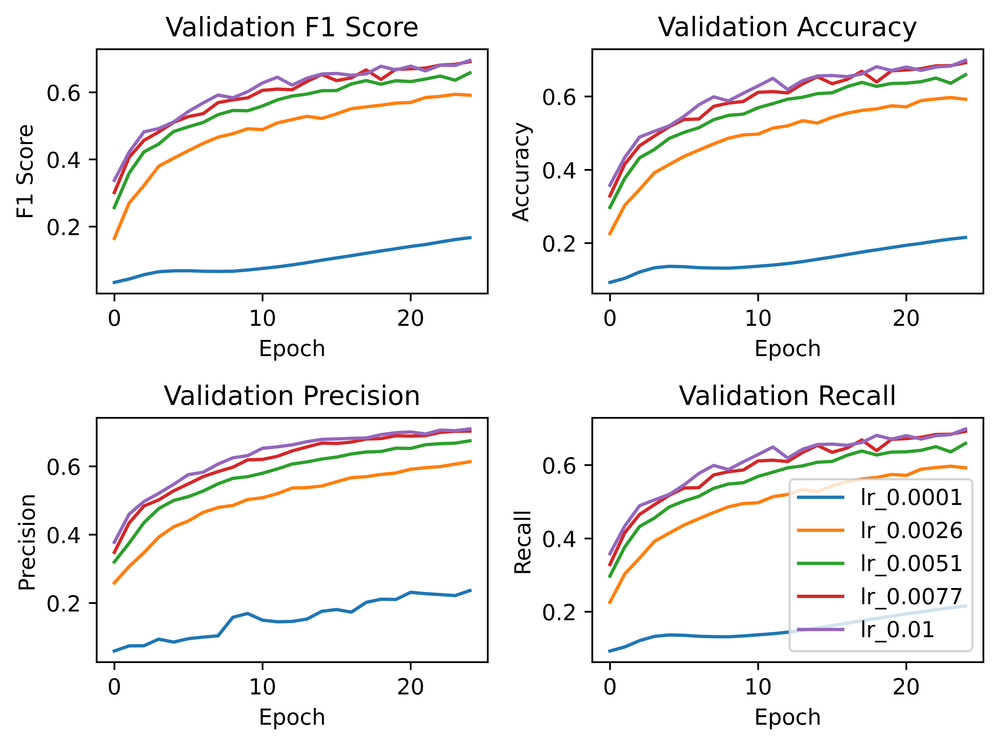

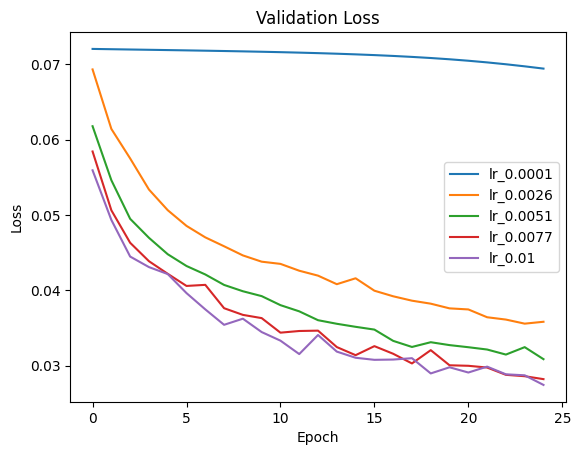

In [44]:
# Plot results
import matplotlib.pyplot as plt

def plot_validation_metrics(results):
    # Increase DPI for prettier graphs
    plt.figure(dpi=1000)

    # Create a 4x4 subplot
    plt.subplot(2, 2, 1)
    # Give it a title
    plt.title("Validation F1 Score")
    # Plot the f1 validation scores according to which learning rate produced them
    for var in results.keys():
        plt.plot(results[var]["val_metrics"]["f1-score"], label=var)
    # Change the x and y labels
    plt.xlabel("Epoch")
    plt.ylabel("F1 Score")

    # See above
    plt.subplot(2, 2, 2)
    plt.title("Validation Accuracy")
    for var in results.keys():
        plt.plot(results[var]["val_metrics"]["accuracy"], label=var)
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")

    # See above
    plt.subplot(2, 2, 3)
    plt.title("Validation Precision")
    for var in results.keys():
        plt.plot(results[var]["val_metrics"]["precision"], label=var)
    plt.xlabel("Epoch")
    plt.ylabel("Precision")

    # See above
    plt.subplot(2, 2, 4)
    plt.title("Validation Recall")
    for var in results.keys():
        plt.plot(results[var]["val_metrics"]["recall"], label=var)
    plt.xlabel("Epoch")
    plt.ylabel("Recall")

    # Enable the legend
    plt.legend()
    # Ensure the graphs don't overlap
    plt.tight_layout()
    # Show the figure
    plt.show()

    # Plot the average validation loss of each of the learning rates tested
    plt.title("Validation Loss")
    for var in results.keys():
        plt.plot(results[var]["val_loss"], label=var)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()
plot_validation_metrics(e1p1_results_averaged)

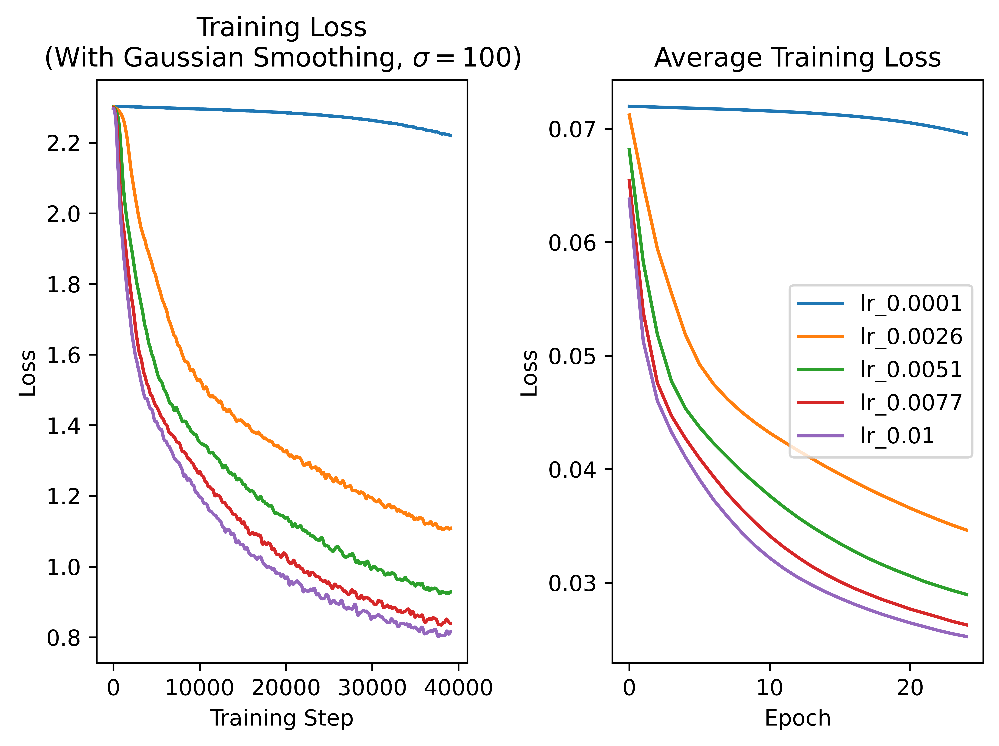

In [45]:
# Plot training loss

from scipy.ndimage import gaussian_filter  # For smoothing the loss graph

sigma = 100  # Smoothing parameter
def plot_train(results, sigma = sigma):
    plt.figure(dpi=1000)
    plt.subplot(1, 2, 1)
    plt.title(f"Training Loss\n(With Gaussian Smoothing, $\\sigma = {sigma})$")
    for var in results.keys():
        plt.plot(gaussian_filter(results[var]["loss"], sigma), label=var)
    plt.xlabel("Training Step")
    plt.ylabel("Loss")
    plt.subplot(1, 2, 2)
    plt.title("Average Training Loss")
    for var in results.keys():
        plt.plot(results[var]["avg_loss"], label=var)
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.tight_layout()
    plt.legend()
    plt.show()

plot_train(e1p1_results_averaged)

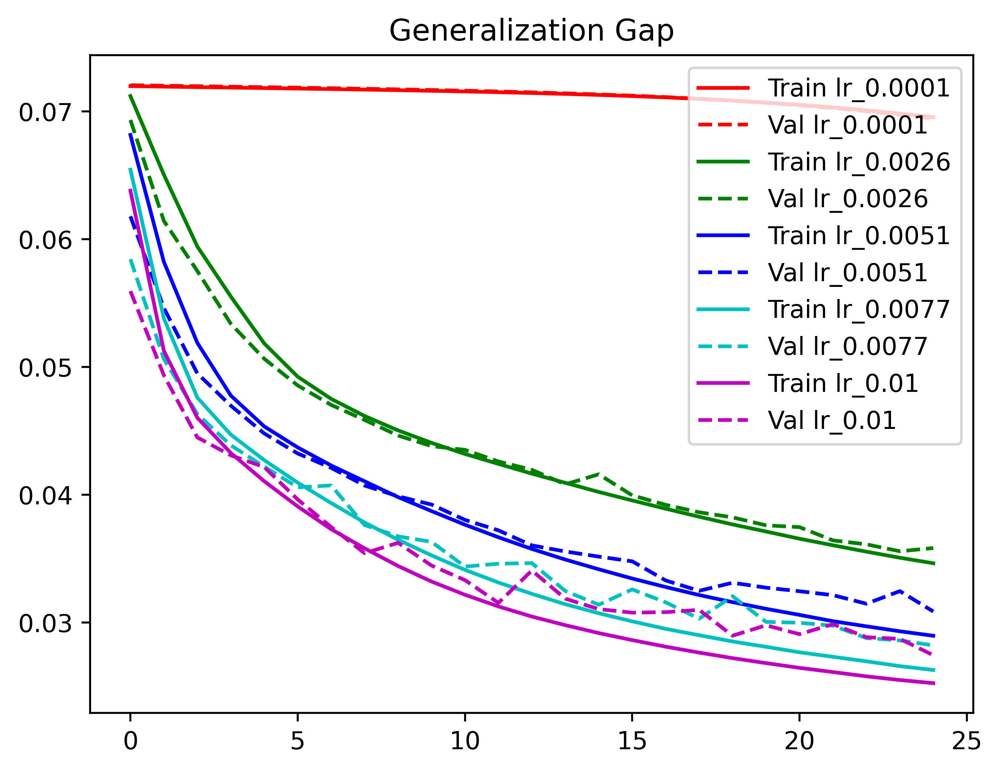

In [46]:
# Plot generalization gap 

colours = ['r', 'g', 'b', 'c', 'm']

plt.figure(dpi=500)
plt.title("Generalization Gap")
for lr, colour in zip(e1p1_results_averaged.keys(), colours):
    plt.plot(e1p1_results_averaged[lr]['avg_loss'], c=colour, label=f"Train {lr}")
    plt.plot(e1p1_results_averaged[lr]['val_loss'], c=colour, linestyle='dashed', label=f"Val {lr}")
plt.legend()

plt.show()

In [47]:
# Experiment 1, part 2
def lerp_lr(epoch: int, start_lr: float = 0.01, end_lr: float = 0.0001) -> float:
    alpha = epoch / EPOCHS
    beta = (EPOCHS - epoch) / EPOCHS

    return alpha * end_lr + beta * start_lr


def train():
    val_metrics = []
    train_loss = []
    val_loss = []
    avg_loss = []
    # Gets an instance of model based on the argument '--model-name' argument
    # and send it to the gpu
    image_classifier = ImageClassifier().to(device)

    optimizer = torch.optim.SGD(
        image_classifier.parameters(), lr=LR, weight_decay=DECAY_RATE
    )

    # Use the custom learning rate scheduler, lerp_lr
    scheduler = lr_scheduler.LambdaLR(optimizer, lerp_lr)

    # Get the datasets
    train_loader, test_loader = get_datasets()

    # Cache the number of samples within each of the datasets
    n_samples = {"train": len(train_loader.dataset), "test": len(test_loader.dataset)}

    # Loop for the number of epochs specified '--epochs'
    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for images, labels in train_loader:
            # Send the batches and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)
            # Backpropagate
            loss.backward()
            optimizer.step()
            # Add loss for this batch to the total loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())

        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier, test_loader
        )
        val_loss.append(total_val_loss / n_samples["test"])

        # Update the learning rate
        scheduler.step()

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        val_metrics.append(metrics)

    return val_metrics[-1], val_loss, val_metrics, avg_loss, train_loss


# Define the parameters for this experiment
config = {"num_runs": 5}
LR = 0.01  # Base learning rate
e1p2_results = {}
if DO_EXPERIMENTS:
    for i in trange(config["num_runs"], desc="Performing experiment"):
        test_metrics, val_loss, val_metrics, avg_loss, loss = train()
        e1p2_results[f"run_{i}"] = { 
            "test_metrics": test_metrics,
            "val_metrics": val_metrics,
            "val_loss": val_loss,
            "avg_loss": avg_loss,
            "loss": loss,
        }

In [48]:
# Save results to file 
if DO_EXPERIMENTS:
    with open("./results/experiment-1-part-2.json", "w") as results_file:
        json.dump(e1p2_results, results_file)
else:
    with open("./results/experiment-1-part-2.json", "r") as results_file:
        e1p2_results = json.load(results_file)

In [49]:
# Average results
e1p2_results_averaged = {
    "test_metrics": {
        "f1-score": np.mean(
            [
                e1p2_results[run]["test_metrics"]["weighted avg"]["f1-score"]
                for run in e1p2_results.keys()
            ]
        ),
        "precision": np.mean(
            [
                e1p2_results[run]["test_metrics"]["weighted avg"]["precision"]
                for run in e1p2_results.keys()
            ]
        ),
        "recall": np.mean(
            [
                e1p2_results[run]["test_metrics"]["weighted avg"]["recall"]
                for run in e1p2_results.keys()
            ]
        ),
        "accuracy": np.mean(
            [
                e1p2_results[run]["test_metrics"]["accuracy"]
                for run in e1p2_results.keys()
            ]
        ),
    },
    "val_loss": list(
        np.mean([e1p2_results[run]["val_loss"] for run in e1p2_results.keys()], axis=0)
    ),
    "avg_loss": list(
        np.mean([e1p2_results[run]["avg_loss"] for run in e1p2_results.keys()], axis=0)
    ),
    "train_loss": list(
        np.mean([e1p2_results[run]["loss"] for run in e1p2_results.keys()], axis=0)
    ),
    "val_metrics": {
        "f1-score": list(
            np.mean(
                [
                    [
                        val_metric["weighted avg"]["f1-score"]
                        for val_metric in e1p2_results[run]["val_metrics"]
                    ]
                    for run in e1p2_results.keys()
                ],
                axis=0,
            )
        ),
        "precision": list(
            np.mean(
                [
                    [
                        val_metric["weighted avg"]["precision"]
                        for val_metric in e1p2_results[run]["val_metrics"]
                    ]
                    for run in e1p2_results.keys()
                ],
                axis=0,
            )
        ),
        "recall": list(
            np.mean(
                [
                    [
                        val_metric["weighted avg"]["recall"]
                        for val_metric in e1p2_results[run]["val_metrics"]
                    ]
                    for run in e1p2_results.keys()
                ],
                axis=0,
            )
        ),
        "accuracy": list(
            np.mean(
                [
                    [
                        val_metric["accuracy"]
                        for val_metric in e1p2_results[run]["val_metrics"]
                    ]
                    for run in e1p2_results.keys()
                ],
                axis=0,
            )
        ),
    },
}

with open("./results/averaged-experiment-1-part-2.json", "w") as file:
    json.dump(e1p2_results_averaged, file)

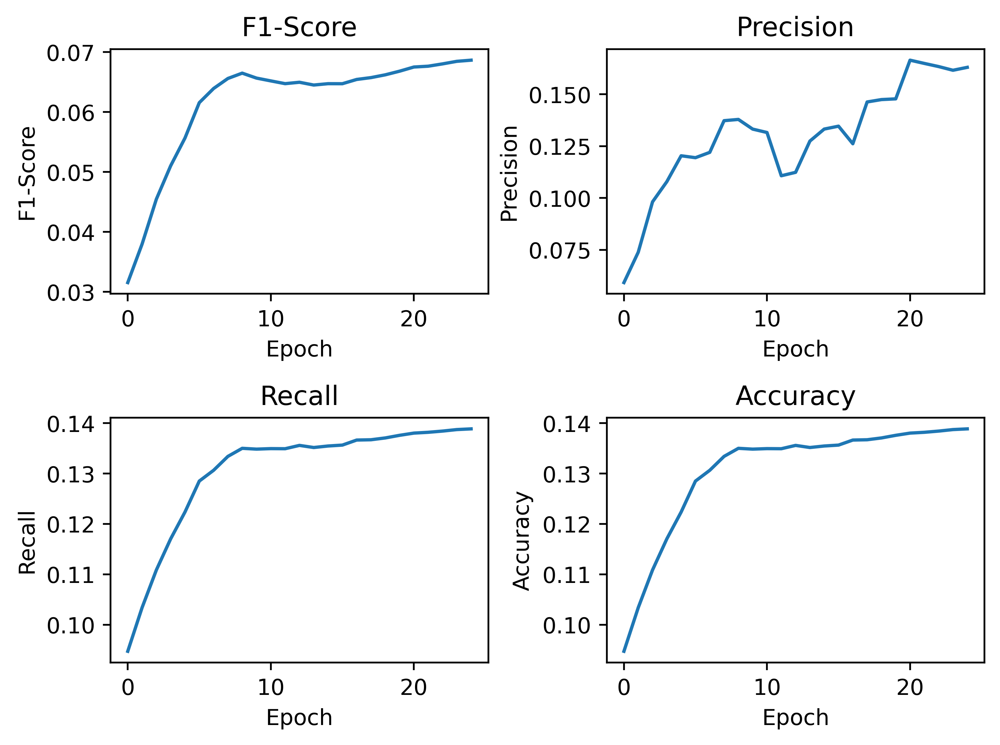

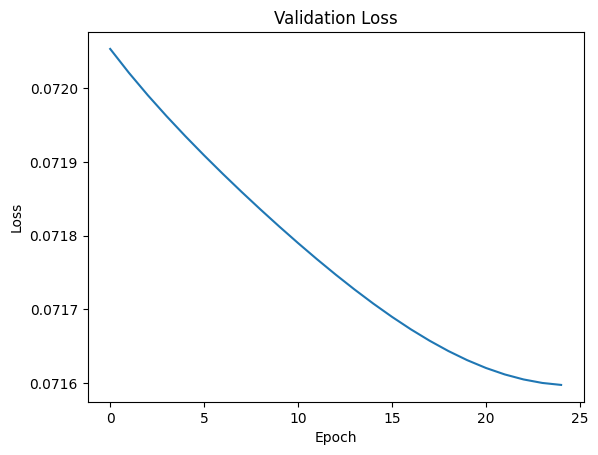

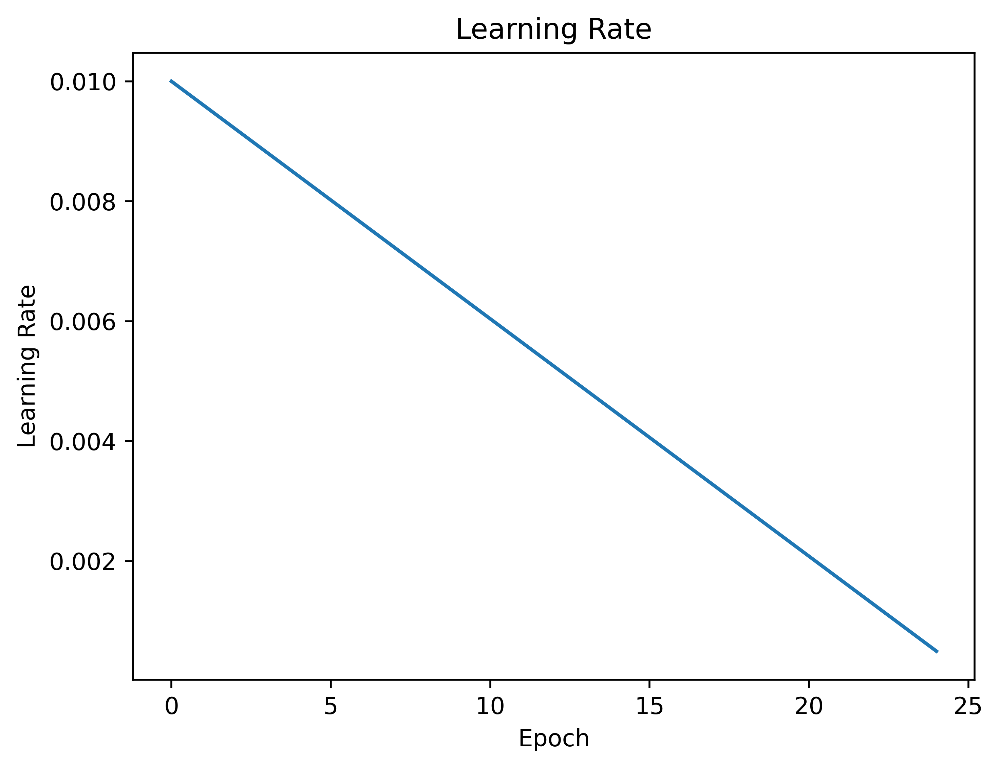

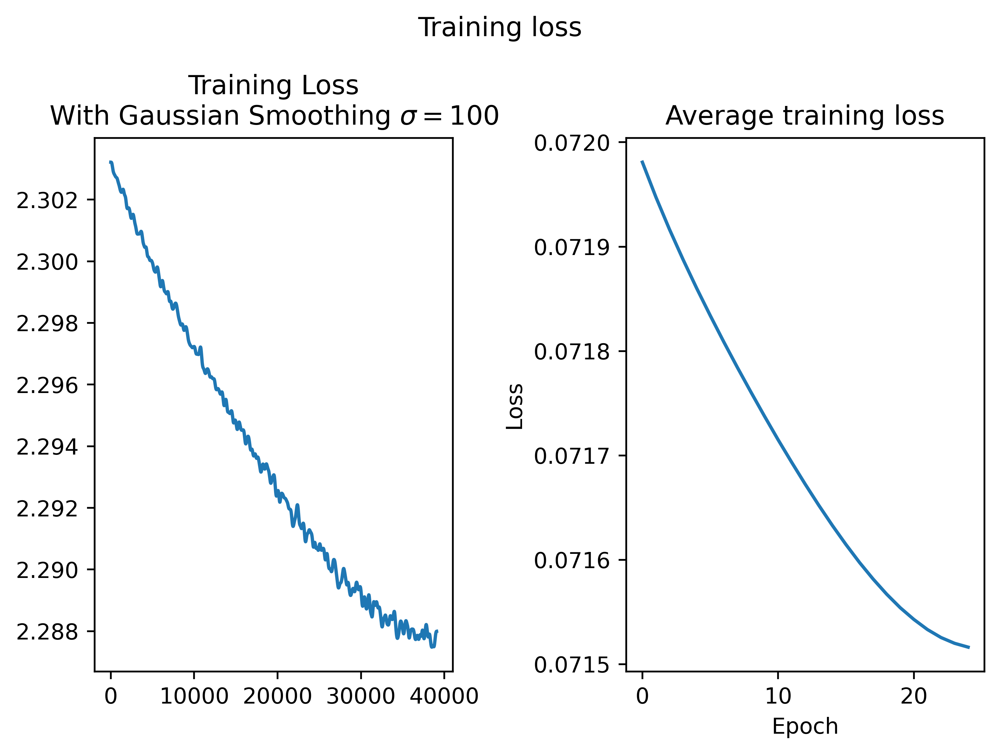

In [50]:
# Plot each of the averaged validation metrics on a graph
plt.figure(dpi=500)
for i, key in enumerate(e1p2_results_averaged["val_metrics"]):
    plt.subplot(2, 2, i + 1)
    plt.title(key.title())
    plt.plot(e1p2_results_averaged["val_metrics"][key])
    plt.xlabel("Epoch")
    plt.ylabel(key.title())

plt.tight_layout()
plt.show()
plt.title("Validation Loss")
plt.plot(e1p2_results_averaged["val_loss"])
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.show()

plt.figure(dpi=500)
plt.title("Learning Rate")
plt.plot([lerp_lr(i) for i in range(EPOCHS)])
plt.ylabel("Learning Rate")
plt.xlabel("Epoch")
plt.show()

plt.figure(dpi=500)
plt.suptitle("Training loss")
plt.subplot(1, 2, 1)
plt.title(f"Training Loss\nWith Gaussian Smoothing $\sigma={sigma}$")
plt.plot(gaussian_filter(e1p2_results_averaged["train_loss"], sigma))
plt.subplot(1, 2, 2)
plt.title(f"Average training loss")
plt.plot(e1p2_results_averaged['avg_loss'])
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.tight_layout()
plt.show() 

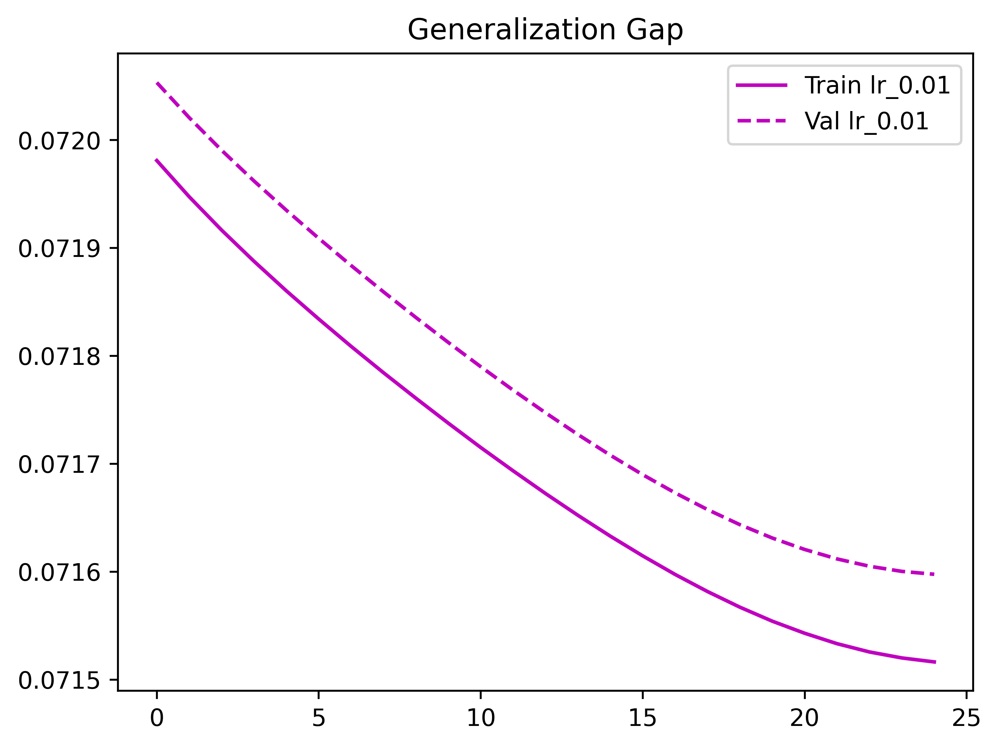

In [51]:
# Plot generalization gap 

colours = ['r', 'g', 'b', 'c', 'm']

plt.figure(dpi=500)
plt.title("Generalization Gap")
plt.plot(e1p2_results_averaged['avg_loss'], c=colour, label=f"Train {lr}")
plt.plot(e1p2_results_averaged['val_loss'], c=colour, linestyle='dashed', label=f"Val {lr}")
plt.legend()

plt.show()

### Experiment 2 (19 MARKS) <ignore>

In this experiment, I found that on average, dropout rate does not effect the models performance. As exhibited in the graphs below, the average accuracies are similar across dropout rates. This could indicate higher dropout rates should be selected. 

As displayed in the previous experiment, the model performs well, as there are no indications of the model overfitting, which dropout is used to prevent. 

Therefore, in this case, dropout has no effect on this model. 

In the transfer learning experiment, I also found that no dropout also leads to better performance, achieving a higher accuracy (0.58) than the model with dropout (0.52).

In [52]:
# Code for Experiment 2, part 1  

import torch.nn.init as init

LR = 0.01


# Create a new model inheriting from the previous one
class ImageClassifierWithDropout(ImageClassifier):
    def __init__(self, dropout_rate):
        super().__init__()
        # add the two dropout layers controled by the dropout_rate
        # argument
        self.dropout1 = nn.Dropout(p=dropout_rate)

    # Re-initialises the weights of the nodes in the fully connectect layers
    def reinitialize_fc_weights(self):
        init.kaiming_uniform_(self.fc1.weight, nonlinearity="relu")
        init.kaiming_uniform_(self.fc2.weight, nonlinearity="relu")
        if self.fc1.bias is not None:
            init.constant_(self.fc1.bias, 0)
        if self.fc2.bias is not None:
            init.constant_(self.fc2.bias, 0)

    def forward(self, x):
        # Apply first convolutional layer, ReLU activation and max pooling
        x = self.conv1(x)  # 32x32x32
        x = F.relu(x)
        x = self.pool1(x)  # 32x16x16

        # Apply second convolutional layer, ReLU activation and max pooling
        x = self.conv2(x)  # 64x16x16
        x = F.relu(x)
        x = self.pool2(x)  # 64x8x8

        # Apply third convolutional layer, ReLU activation and max pooling
        x = self.conv3(x)  # 128x8x8
        x = F.relu(x)
        x = self.pool3(x)  # 128x4x4

        # Flatten the tensor before passing to fully connected layers
        x = x.view(-1, 2048)

        # Apply first fully connected layer and ReLU activation
        x = self.fc1(x)  # 512
        x = F.relu(x)
        x = self.dropout1(x)  # perform dropout

        # Apply second fully connected layer (output layer)
        x = self.fc2(x)  # 10

        return x


def get_train_test_and_val():
    # Split the training data in two
    train, val = random_split(
        torchvision.datasets.CIFAR10(
            root="./cifar10", train=True, download=False, transform=transform
        ),
        [0.5, 0.5],
    )

    test = torchvision.datasets.CIFAR10(
        root="./cifar10", train=False, download=False, transform=transform
    )

    # Load each of the datasets into a dataloader
    train_loader = DataLoader(train, shuffle=True, batch_size=BATCH_SIZE)
    val_loader = DataLoader(val, shuffle=False, batch_size=BATCH_SIZE)
    test_loader = DataLoader(test, shuffle=False, batch_size=BATCH_SIZE)

    return train_loader, val_loader, test_loader


def train(dropout, i):
    val_metrics = []
    train_loss = []
    val_loss = []
    avg_loss = []

    image_classifier = ImageClassifierWithDropout(dropout_rate=dropout).to(device)

    optimizer = torch.optim.SGD(
        image_classifier.parameters(), lr=LR, weight_decay=DECAY_RATE
    )

    # Get the datasets
    train_loader, val_loader, test_loader = get_train_test_and_val()

    # Cache the number of samples within each of the datasets
    n_samples = {
        "train": len(train_loader.dataset),
        "test": len(test_loader.dataset),
        "val": len(val_loader.dataset),
    }

    # Loop for the number of epochs specified '--epochs'
    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for images, labels in train_loader:
            # Send the batches and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)
            # Backpropagate
            loss.backward()
            optimizer.step()
            # Add loss for this batch to the total loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())

        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier, val_loader
        )
        val_loss.append(total_val_loss / n_samples["val"])

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        val_metrics.append(metrics)
    test_predictions, test_labels, total_test_loss = evaluate(
        image_classifier, test_loader
    )
    test_metrics = classification_report(
        test_labels, test_predictions, output_dict=True, zero_division=0.0
    )
    torch.save(
        image_classifier.state_dict(),
        f"./models/image-classifier-with-dropout-{dropout}-R{i}.pt",
    )
    return (
        test_metrics,
        total_test_loss / n_samples["test"],
        val_loss,
        val_metrics,
        avg_loss,
        train_loss,
    )


config = {
    "num_runs": 5,
    "dropout_rates": [0, 0.0625, 0.125, 0.1875, 0.25],
}

e2p1_results = {
    f"run_{i}": {f"dropout_{dropout}": {} for dropout in config["dropout_rates"]}
    for i in range(config["num_runs"])
}
if DO_EXPERIMENTS:
    with tqdm(
        total=(config["num_runs"] * len(config["dropout_rates"])),
        desc="Performing Experiment...",
    ) as bar:
        for i in range(config["num_runs"]):
            for dropout in config["dropout_rates"]:
                test_metrics, test_loss, val_loss, val_metrics, avg_loss, loss = train(
                    dropout, i
                )
                e2p1_results[f"run_{i}"][f"dropout_{dropout}"] = {
                    "test_metrics": test_metrics,
                    "test_loss": test_loss,
                    "val_loss": val_loss,
                    "val_metrics": val_metrics,
                    "avg_loss": avg_loss,
                    "loss": loss,
                }
                bar.update(1)

In [53]:
# Save results to a file 
if DO_EXPERIMENTS:
    with open("./results/experiment-2-part-1.json", "w") as file:
        json.dump(e2p1_results, file)
else:
    with open("./results/experiment-2-part-1.json", "r") as file:
        e2p1_results = json.load(file)

e2p1_results_averaged = average_results(e2p1_results)

with open("./results/averaged-experiment-2-part-1.json", "w") as file:
    json.dump(e2p1_results_averaged, file)

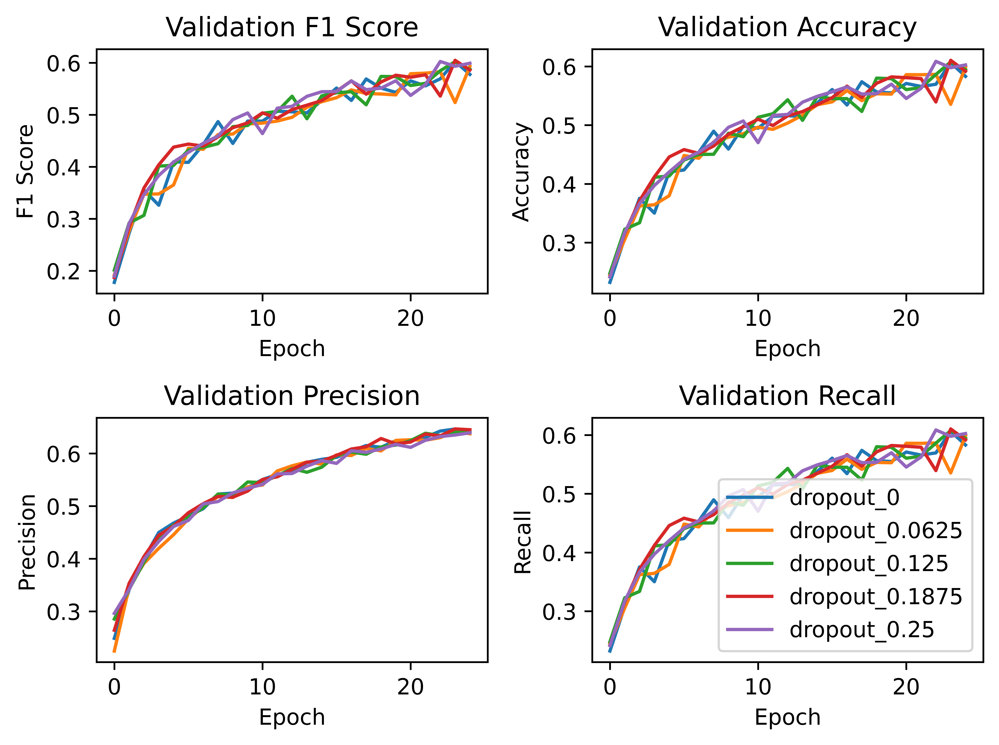

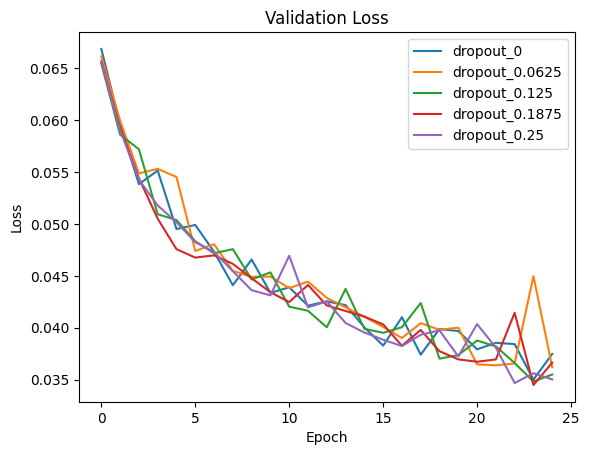

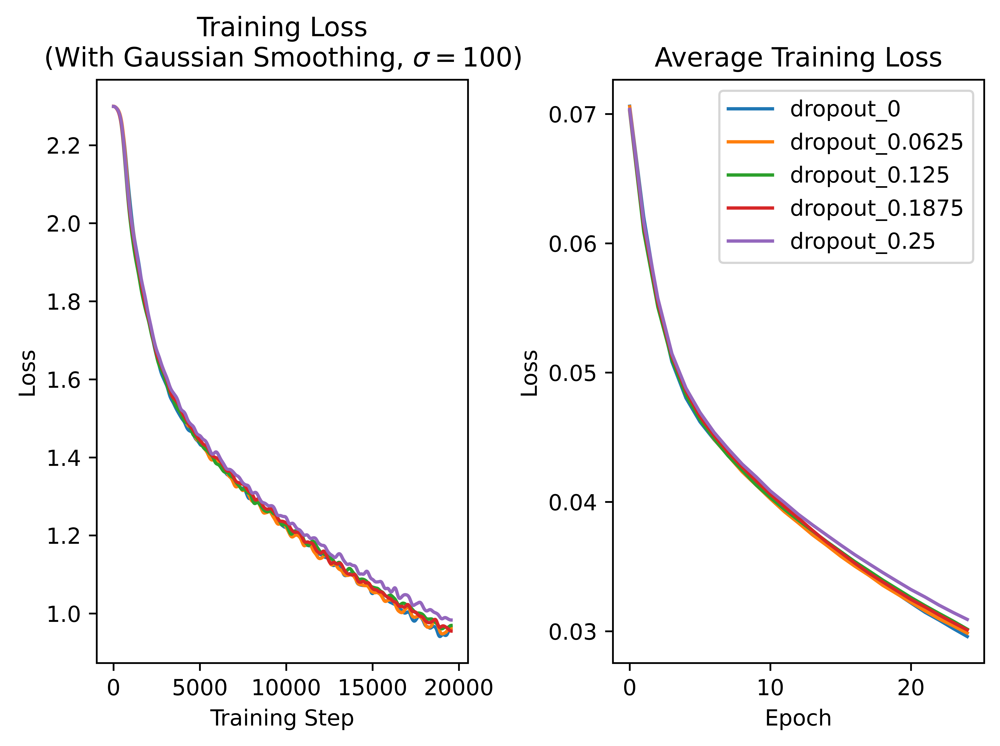

In [54]:
# Plot validation and training metrics 
plot_validation_metrics(e2p1_results_averaged)
plot_train(e2p1_results_averaged)

In [55]:
# Code for Experiment 2, part 2


def train(dropout, model_path):
    val_metrics = []
    train_loss = []
    val_loss = []
    avg_loss = []

    # Load the image classifier model with dropout from a state dictionary
    # and send it to the gpu
    image_classifier = ImageClassifierWithDropout(dropout).to(device)
    image_classifier.load_state_dict(torch.load(model_path))

    # Go over each convolutional layer within the image classifier model
    for conv_layer in [
        image_classifier.conv1,
        image_classifier.conv2,
        image_classifier.conv3,
    ]:
        # Indicate each of the parameters of the convolutional layers do not need to be optimized
        for parameter in conv_layer.parameters():
            parameter.requires_grad = False

    # Re-initialize the weights in the fully connected layers using
    # using the kaiming initialization method
    image_classifier.reinitialize_fc_weights()

    # Tell the optimizer to not optimize any of the parameters in the convolutional layers
    optimizer = torch.optim.SGD(
        filter(lambda p: p.requires_grad, image_classifier.parameters()),
        lr=LR,
        weight_decay=DECAY_RATE,
    )

    # Get the datasets, train and val have been swapped in this case
    val_loader, train_loader, test_loader = get_train_test_and_val()

    # Cache the number of samples within each of the datasets
    n_samples = {
        "train": len(train_loader.dataset),
        "test": len(test_loader.dataset),
        "val": len(val_loader.dataset),
    }

    # Loop for the number of epochs specified '--epochs'
    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for images, labels in train_loader:
            # Send the batches and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)
            # Backpropagate
            loss.backward()
            optimizer.step()
            # Add loss for this batch to the total loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())

        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier, val_loader
        )
        val_loss.append(total_val_loss / n_samples["val"])

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        val_metrics.append(metrics)
    test_predictions, test_labels, total_test_loss = evaluate(
        image_classifier, test_loader
    )
    test_metrics = classification_report(
        test_labels, test_predictions, output_dict=True, zero_division=0.0
    )
    return (
        test_metrics,
        total_test_loss / n_samples["test"],
        val_loss,
        val_metrics,
        avg_loss,
        train_loss,
    )


config = {
    "num_runs": 5,
    "dropout_rates": [0, 0.25],
}

e2p2_results = {
    f"run_{i}": {f"dropout_{dropout}": {} for dropout in config["dropout_rates"]}
    for i in range(config["num_runs"])
}
if DO_EXPERIMENTS:
    with tqdm(
        total=(config["num_runs"] * len(config["dropout_rates"])),
        desc="Running Experiment",
    ) as bar:
        for i in range(config["num_runs"]):
            for dropout in config["dropout_rates"]:
                run = np.random.randint(0, 5)
                test_metrics, test_loss, val_loss, val_metrics, avg_loss, loss = train(
                    dropout, f"./model/image-classifier-with-dropout-{dropout}-R{run}.pt"
                )
                e2p2_results[f"run_{i}"][f"dropout_{dropout}"] = {
                    "model": f"./models/image-classifier-with-dropout-{dropout}-R{run}.pt",
                    "test_metrics": test_metrics,
                    "test_loss": test_loss,
                    "val_loss": val_loss,
                    "val_metrics": val_metrics,
                    "avg_loss": avg_loss,
                    "loss": loss,
                }
                bar.update(1)

In [56]:
# Save results to file 
if DO_EXPERIMENTS:
    with open("./results/experiment-2-part-2.json", "w") as file:
        json.dump(e2p2_results, file)
else:
    with open("./results/experiment-2-part-2.json", "r") as file:
        e2p2_results = json.load(file)


e2p2_results_averaged = average_results(e2p2_results)

with open("./results/averaged-experiment-2-part-2.json", "w") as file:
    json.dump(e2p2_results_averaged, file)

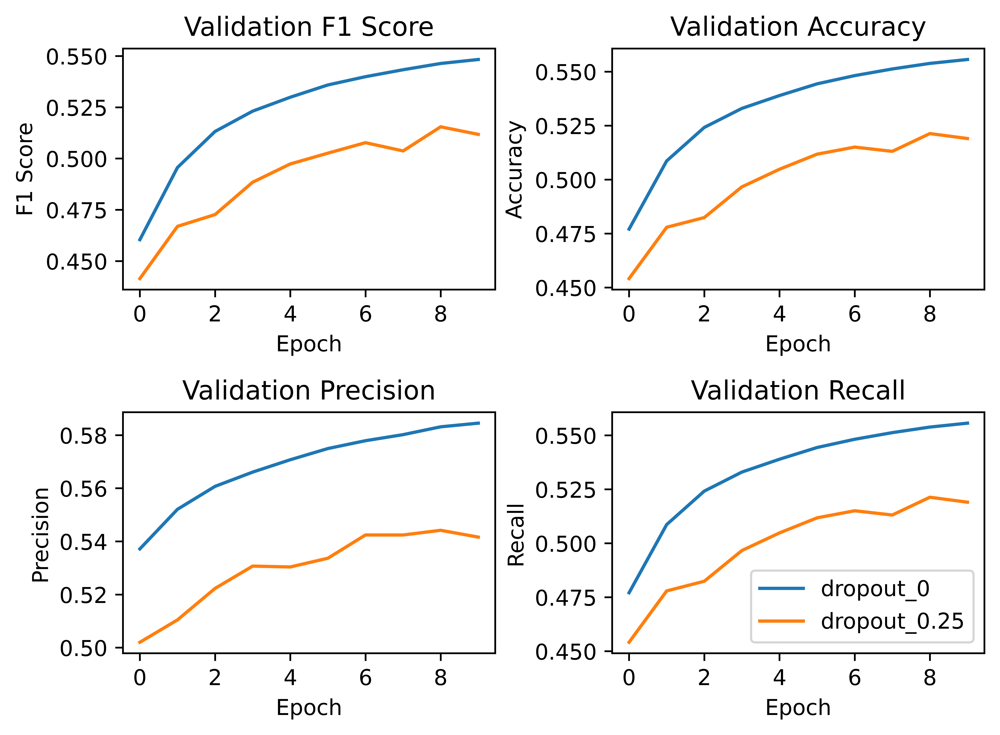

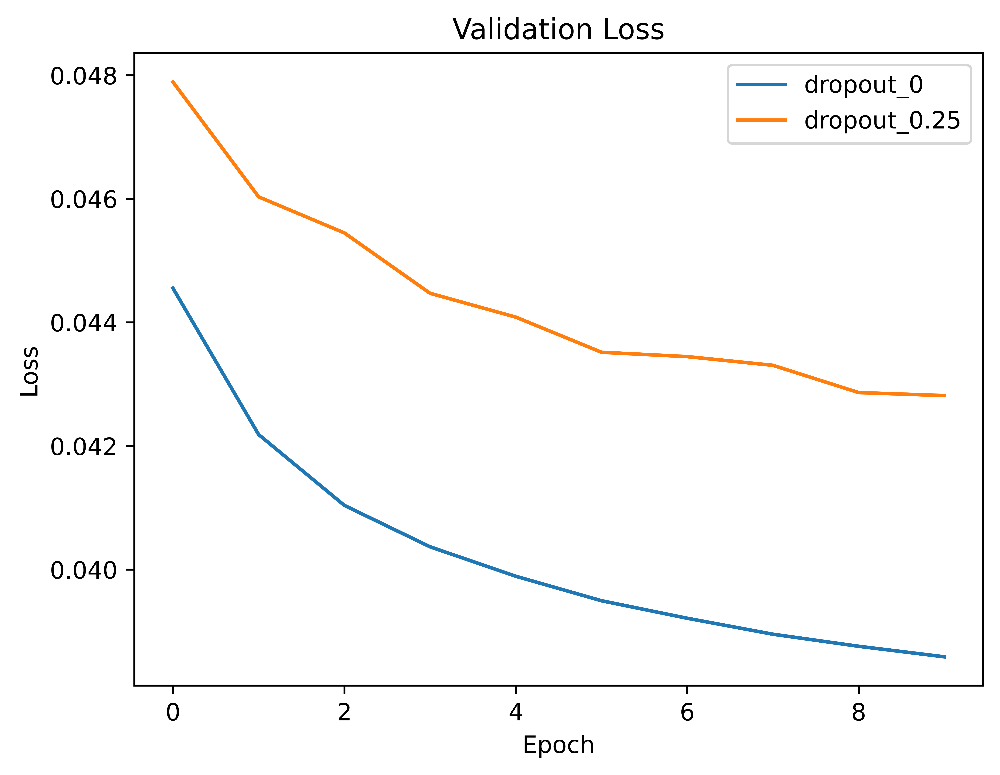

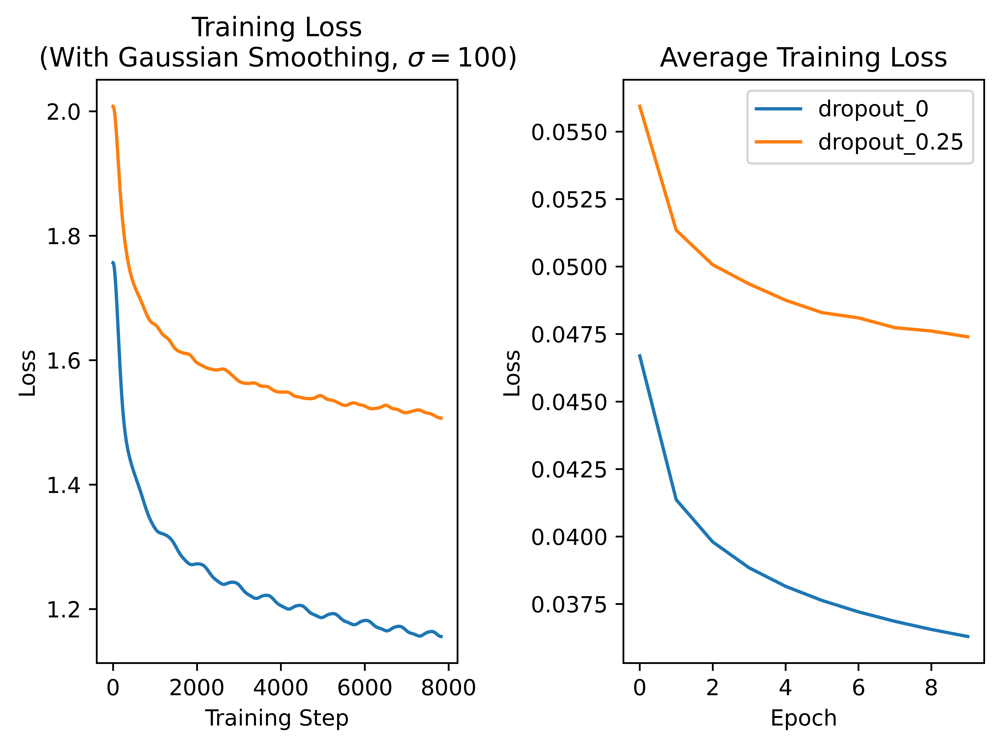

In [57]:
# Plot validation and training metrics

plt.figure(dpi=1000)

plt.subplot(2, 2, 1)
plt.title("Validation F1 Score")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["val_metrics"]["f1-score"], label=var)
plt.xlabel("Epoch")
plt.ylabel("F1 Score")

plt.subplot(2, 2, 2)
plt.title("Validation Accuracy")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["val_metrics"]["accuracy"], label=var)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")


plt.subplot(2, 2, 3)
plt.title("Validation Precision")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["val_metrics"]["precision"], label=var)
plt.xlabel("Epoch")
plt.ylabel("Precision")

plt.subplot(2, 2, 4)
plt.title("Validation Recall")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["val_metrics"]["recall"], label=var)
plt.xlabel("Epoch")
plt.ylabel("Recall")

plt.legend()
plt.tight_layout()
plt.show()

plt.figure(dpi=1000)
plt.title("Validation Loss")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["val_loss"], label=var)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

plt.figure(dpi=1000)
plt.subplot(1, 2, 1)
plt.title("Training Loss\n(With Gaussian Smoothing, $\\sigma = 100)$")
for var in e2p2_results_averaged.keys():
    plt.plot(gaussian_filter(e2p2_results_averaged[var]["loss"], sigma), label=var)
plt.xlabel("Training Step")
plt.ylabel("Loss")
plt.subplot(1, 2, 2)
plt.title("Average Training Loss")
for var in e2p2_results_averaged.keys():
    plt.plot(e2p2_results_averaged[var]["avg_loss"], label=var)
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.tight_layout()
plt.legend()
plt.show()

### Experiment 3 (19 MARKS) <ignore>

This experiment investigates the quality of gradient flow throughout the network. In the first experiment, we see the mean gradients at the first few layers sharply increase across the first few convolutional layers, and then stablise across the latter layers. Both the gradients across the first 5 episodes and final 5 episodes of training display similar characteristics, indicating the model is close to converging a solution. The first episode shows a lower mean across the layers on average, which fluctuates over episodes. The final episode tested lands approximately in the middle of all episoes. 

When testing the model on the best performing model with no dropout, in this case the first run with a dropout rate of 0.25, displays similar behaviour to the other models tested. 

When investigating the effect of BatchNormalization on the quality of gradient flow, we see the average gradient across layers demonstrate stable flow, until it reaches the fully connected layers where it fluctuates across each layer. This behaviour is almost a perfect match across each of the training episodes, and at the start and end of training. 

Overall, models with batch normalization are less performant than the dropout models tested. This is exhibited in the large gap between the average training loss, and the validation loss. 

In [65]:
# Code for Experiment 3, part 1


def train(model_path, dropout, num_episodes, callback):
    start_parameters = []
    end_parameters = []
    val_metrics = []
    train_loss = []
    val_loss = []
    avg_loss = []
    # Load the model for this experiment
    image_classifier_no_dropout = ImageClassifierWithDropout(dropout).to(device)
    image_classifier_no_dropout.load_state_dict(torch.load(model_path))

    optimizer = optim.SGD(image_classifier_no_dropout.parameters(), lr=LR)

    # Get the datasets
    train_loader, val_loader, test_loader = get_train_test_and_val()

    # Cache the number of samples within each of the datasets
    n_samples = {
        "train": len(train_loader.dataset),
        "test": len(test_loader.dataset),
        "val": len(val_loader.dataset),
    }

    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier_no_dropout.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for i, (images, labels) in enumerate(train_loader):
            # Send the batches and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier_no_dropout.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)

            if i < num_episodes and epoch == 0:
                start_parameters.append(
                    dict(image_classifier_no_dropout.named_parameters())
                )
            elif i > len(train_loader) - (num_episodes + 1) and epoch == EPOCHS - 1:
                end_parameters.append(
                    dict(image_classifier_no_dropout.named_parameters())
                )

            # Backpropagate
            loss.backward()
            optimizer.step()

            # Add loss for this batch to the total loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())
        
        callback(1)

        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier_no_dropout, val_loader
        )
        val_loss.append(total_val_loss / n_samples["val"])

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        val_metrics.append(metrics)

    test_predictions, test_labels, total_test_loss = evaluate(
        image_classifier_no_dropout, test_loader
    )
    test_metrics = classification_report(
        test_labels, test_predictions, output_dict=True, zero_division=0.0
    )

    return (
        test_metrics,
        total_test_loss / n_samples["test"],
        val_loss,
        val_metrics,
        avg_loss,
        train_loss,
        start_parameters,
        end_parameters,
    )


# Randomly pick one of the runs to use for this experiment
# where dropout = 0

NUM_EPISODES = 5
idx = np.random.randint(0, 5)
model_path = f"./models/image-classifier-with-dropout-0-R{idx}.pt"
DO_EXPERIMENTS = True 
if DO_EXPERIMENTS:
    with tqdm(total=EPOCHS, desc="Running experiment...") as bar: 
        e3p1_results = train(model_path, 0, NUM_EPISODES, callback=lambda a: bar.update(a))
    

Running experiment...: 100%|██████████| 25/25 [07:45<00:00, 18.61s/it]


In [66]:
# Save the results to file 

# For a non-experiment cell, this takes forever to run,
# and the data collected will likley be massive
def format_results(results): 
    test_metrics = results[0]
    test_loss = results[1]
    val_loss = results[2]
    val_metrics = results[3]
    avg_loss = results[4]
    train_loss = results[5]
    start_gradients = results[6]
    end_gradients = results[7]
    results = {
        "model": model_path,
        "test_metrics": test_metrics,
        "test_loss": test_loss,
        "val_loss": val_loss,
        "val_metrics": val_metrics,
        "avg_loss": avg_loss,
        "train_loss": train_loss,
        "start_parameters": [
            {
                layer_name: parameters.data.detach().cpu().numpy().tolist()
                for layer_name, parameters in episode.items()
            }
            for episode in start_gradients
        ],
        "end_parameters": [
            {
                layer_name: parameters.data.detach().cpu().numpy().tolist()
                for layer_name, parameters in episode.items()
            }
            for episode in end_gradients
        ],
    }
    return results

if DO_EXPERIMENTS:
    e3p1_results = format_results(e3p1_results)
    with open("./results/experiment-3-part-1-raw.json", "w") as file:
        json.dump(e3p1_results, file)
else:
    with open("./results/experiment-3-part-1-raw.json", "r") as file:
        e3p1_results = json.load(file)

In [67]:
# Calculate gradients and their metrics 

start_params = e3p1_results["start_parameters"]
end_params = e3p1_results["end_parameters"]

loss = e3p1_results["train_loss"]


def calculate_gradients(parameters, loss): 
    gradients = []
    for episode, (parameters, e_loss) in enumerate(zip(start_params, loss)):
        gradient = {
            param: (np.array(parameters[param]) / e_loss) for param in parameters.keys()
        }
        gradients.append(gradient)
    return gradients 

def calculate_metrics_from_gradients(gradients):
    gradients_metrics = []
    for model_gradients in start_gradients:
        gradient_metrics_for_episode = {}
        for layer, gradient in model_gradients.items():
            gradient_metrics_for_episode[layer] = (np.mean(gradient), np.std(gradient))
        gradients_metrics.append(gradient_metrics_for_episode)
    return gradients_metrics

start_gradients = calculate_gradients(start_params, loss)
end_gradients = calculate_gradients(end_params, reversed(loss))

start_gradient_metrics = calculate_metrics_from_gradients(start_gradients)
end_gradient_metrics = calculate_metrics_from_gradients(end_gradients)

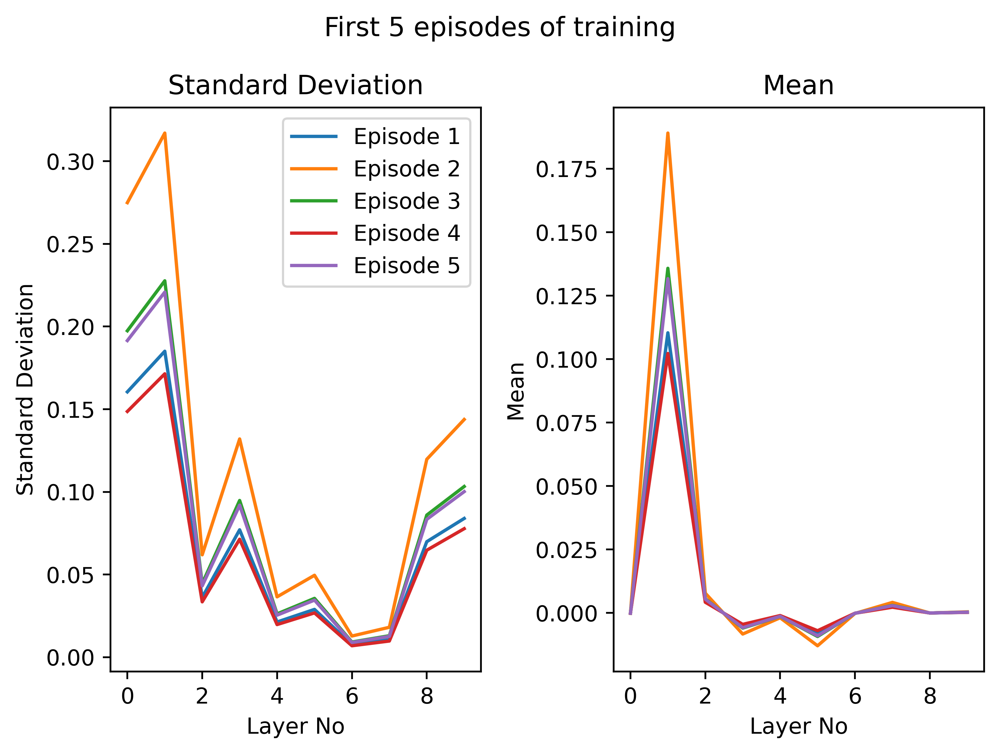

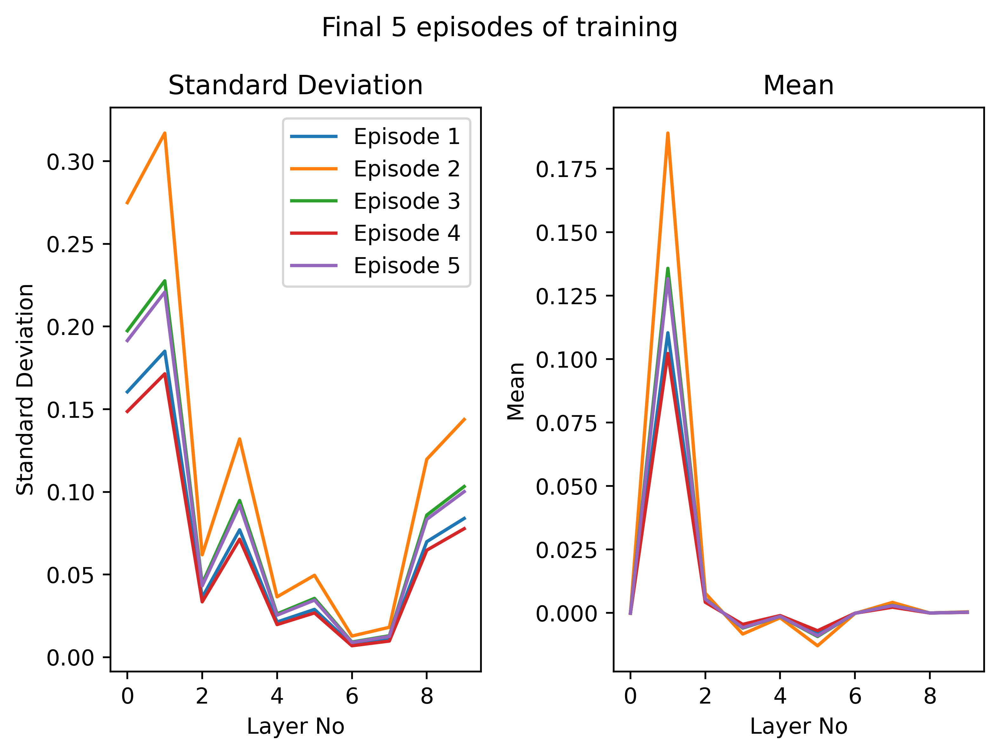

In [68]:
# Plot gradient metrics

def plot_metrics_for_gradients(gradient_metrics, title):
    plt.figure(dpi=500)
    plt.suptitle(title)
    plt.subplot(1, 2, 1)

    plt.title("Standard Deviation")
    for i, episode in enumerate(gradient_metrics):
        plt.plot([std for _, std in episode.values()], label=f"Episode {i + 1}")

    plt.xlabel("Layer No")
    plt.ylabel("Standard Deviation")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.title("Mean")

    for i, episode in enumerate(gradient_metrics):
        plt.plot([mean for mean, _ in episode.values()], label=f"Episode {i + 1}")

    plt.xlabel("Layer No")
    plt.ylabel("Mean")
    plt.tight_layout()
    plt.show()

plot_metrics_for_gradients(start_gradient_metrics, "First 5 episodes of training")
plot_metrics_for_gradients(end_gradient_metrics, "Final 5 episodes of training")

In [ ]:
# Code for Experiment 3, part 2

# Determine the best performing model with a non-zero dropout rate 
# based on its classification accuracy
run_acc = {
    run: {
        dropout: metrics["test_metrics"]["accuracy"]
        for dropout, metrics in e2p1_results[run].items()
        if dropout != "dropout_0"
    }
    for run in e2p1_results.keys()
}

max_acc_for_run = {}
for run, accuracy in run_acc.items():
    best_acc_for_run = max(accuracy, key=lambda dropout: run_acc[run][dropout])
    best_acc_achieved = e2p1_results[run][best_acc_for_run]["test_metrics"]["accuracy"]
    max_acc_for_run[run] = {
        "dropout_rate": float(best_acc_for_run[8:]),
        "acc": best_acc_achieved,
    }
best_from_e2 = max(max_acc_for_run, key=lambda run: max_acc_for_run[run]["acc"])
best_model = {best_from_e2: max_acc_for_run[best_from_e2]}
best_model_path = f"./models/image-classifier-with-dropout-{max_acc_for_run[best_from_e2]['dropout_rate']}-R{best_from_e2[-1]}.pt"


if DO_EXPERIMENTS: 
    with tqdm(total=EPOCHS, desc="Performing exeriment") as bar: 
        e3p2_results = train(best_model_path, list(best_model.values())[0]["dropout_rate"], NUM_EPISODES, callback=lambda a: bar.update(a))

In [ ]:
# Save results 

if DO_EXPERIMENTS:
    e3p2_results = format_results(e3p2_results)
    with open("./results/experiment-3-part-2-raw.json", "w") as file:
        json.dump(e3p2_results, file)
else:
    with open("./results/experiment-3-part-2-raw.json", "r") as file:
        e3p2_results = json.load(file)

In [71]:
# Calculate gradients 

start_params =  e3p2_results['start_parameters']
end_params = e3p2_results['end_parameters']

loss = e3p2_results['train_loss']

start_gradients = calculate_gradients(start_params, loss)
end_gradients = calculate_gradients(end_params, reversed(loss))

start_gradient_metrics = calculate_metrics_from_gradients(start_gradients)
end_gradient_metrics = calculate_metrics_from_gradients(end_gradient_metrics)

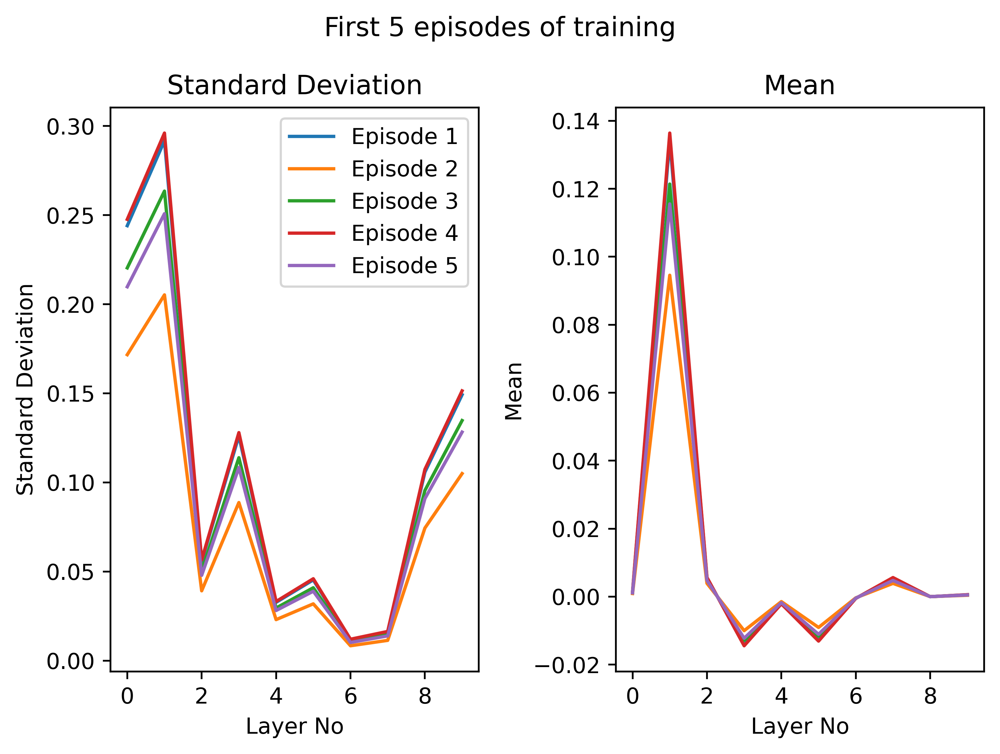

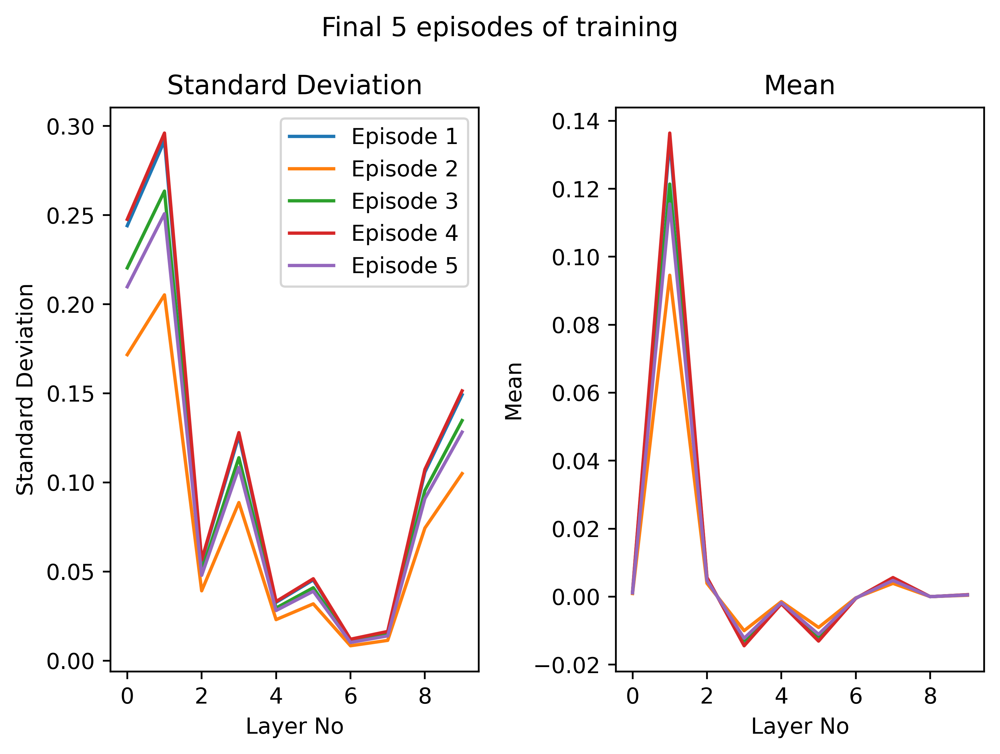

In [72]:
# Plot gradients 
plot_metrics_for_gradients(start_gradient_metrics, "First 5 episodes of training")
plot_metrics_for_gradients(end_gradient_metrics, "Final 5 episodes of training")

In [73]:
# Experiment 3, part 3 
class ImageClassifierWithBatchNorm(ImageClassifier):
    def __init__(self):
        super().__init__()

        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(128)
        self.bn_fc = nn.BatchNorm1d(512)

    def forward(self, x):
        x = self.conv1(x)  # 32x32x32
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool1(x)  # 32x16x16

        x = self.conv2(x)  # 64x16x16
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool2(x)  # 64x8x8

        x = self.conv3(x)  # 128x8x8
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool3(x)  # 128x4x4
        x = self.bn4(x)

        x = x.view(-1, 2048)

        x = self.fc1(x)  # 512
        x = self.bn_fc(x)

        x = self.fc2(x)  # 10

        return x

def train(num_episodes):
    start_parameters = []
    end_parameters = []
    val_metrics = []
    train_loss = []
    val_loss = []
    avg_loss = []
    # Load the model for this experiment
    image_classifier_with_batch_norm = ImageClassifierWithBatchNorm().to(device)

    optimizer = optim.SGD(image_classifier_with_batch_norm.parameters(), lr=LR)

    # Get the datasets
    train_loader, val_loader, test_loader = get_train_test_and_val()

    # Cache the number of samples within each of the datasets
    n_samples = {
        "train": len(train_loader.dataset),
        "test": len(test_loader.dataset),
        "val": len(val_loader.dataset),
    }

    # Loop for the number of epochs specified '--epochs'
    for epoch in range(EPOCHS):
        # Set the model to training mode
        image_classifier_with_batch_norm.train()
        # Record the total training loss each epoch
        total_training_loss = 0

        # Go over each batch in the dataset
        for i, (images, labels) in enumerate(train_loader):
            # Send the batches and labels to the GPU
            images = images.to(device)
            labels = labels.to(device)

            # Reset the gradients of all optimzed tensors
            optimizer.zero_grad()
            # Perform a forward pass on the model with the training data
            output = image_classifier_with_batch_norm.forward(images)
            # Calculate the loss
            loss = criterion(output, labels)

            if i < num_episodes and epoch == 0:
                start_parameters.append(
                    dict(image_classifier_with_batch_norm.named_parameters())
                )
            elif i > len(train_loader) - (num_episodes + 1) and epoch == EPOCHS - 1:
                end_parameters.append(
                    dict(image_classifier_with_batch_norm.named_parameters())
                )

            # Backpropagate
            loss.backward()
            optimizer.step()

            # Add loss for this batch to the total loss
            total_training_loss += loss.item()
            train_loss.append(loss.item())

        avg_loss.append(total_training_loss / n_samples["train"])

        # Perform validation
        val_predictions, val_labels, total_val_loss = evaluate(
            image_classifier_with_batch_norm, val_loader
        )
        val_loss.append(total_val_loss / n_samples["val"])

        # Calculate validation metrics
        metrics = classification_report(
            val_labels, val_predictions, output_dict=True, zero_division=0.0
        )
        val_metrics.append(metrics)

    test_predictions, test_labels, total_test_loss = evaluate(
        image_classifier_with_batch_norm, test_loader
    )
    test_metrics = classification_report(
        test_labels, test_predictions, output_dict=True, zero_division=0.0
    )

    return (
        test_metrics,
        total_test_loss / n_samples["test"],
        val_loss,
        val_metrics,
        avg_loss,
        train_loss,
        start_parameters,
        end_parameters,
    )


if DO_EXPERIMENTS:
    e3p3_results = train(5)
    e3p3_results = format_results(e3p3_results)

    with open("./results/experiment-3-part-3-raw.json", "w") as file:
        json.dump(e3p3_results, file)

In [74]:
# Calculate gradients 
if not DO_EXPERIMENTS:
    with open('./results/experiment-3-part-3-raw.json', 'r') as file: 
        e3p3_results = json.load(file)

start_params = e3p3_results['start_parameters']
end_params = e3p3_results['end_parameters']
loss = e3p3_results['train_loss']

start_gradients = calculate_gradients(start_params, loss)
end_gradients = calculate_gradients(end_params, reversed(loss))

start_gradient_metrics = calculate_metrics_from_gradients(start_gradients)
end_gradient_metrics = calculate_metrics_from_gradients(end_gradients)

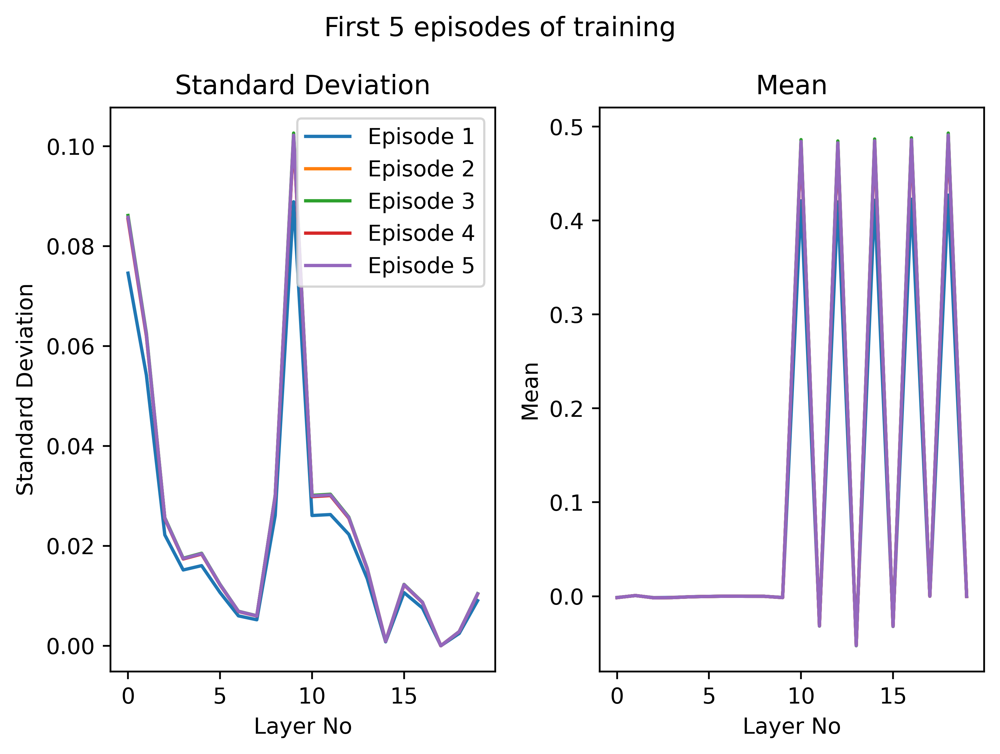

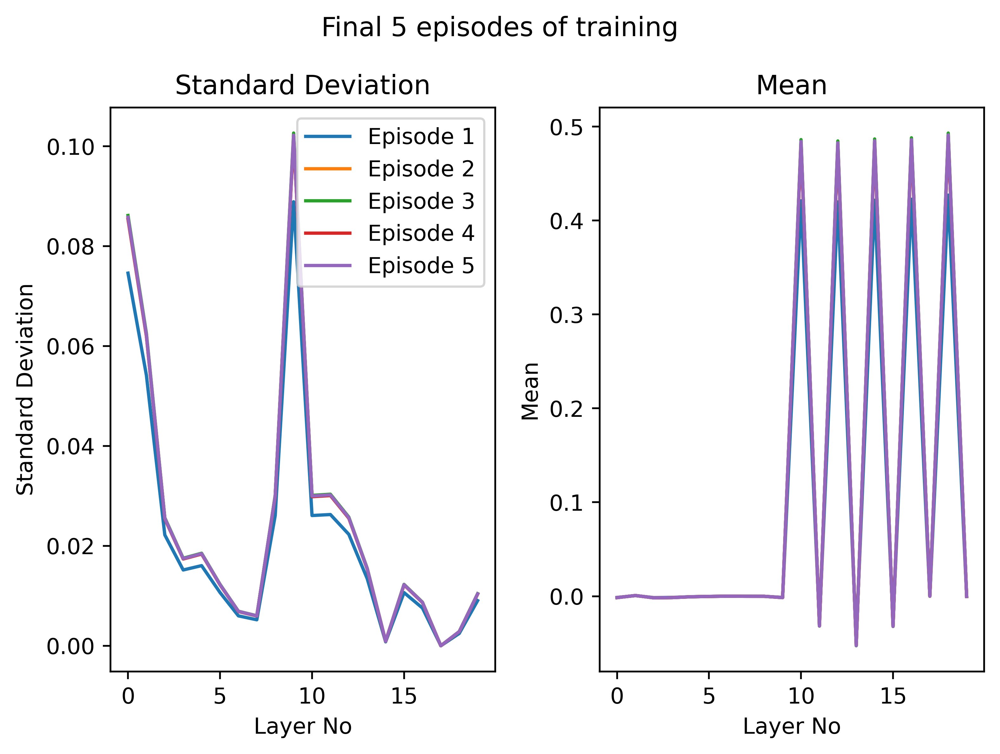

In [75]:
# Plot gradients 
plot_metrics_for_gradients(start_gradient_metrics, "First 5 episodes of training")
plot_metrics_for_gradients(end_gradient_metrics, "Final 5 episodes of training")

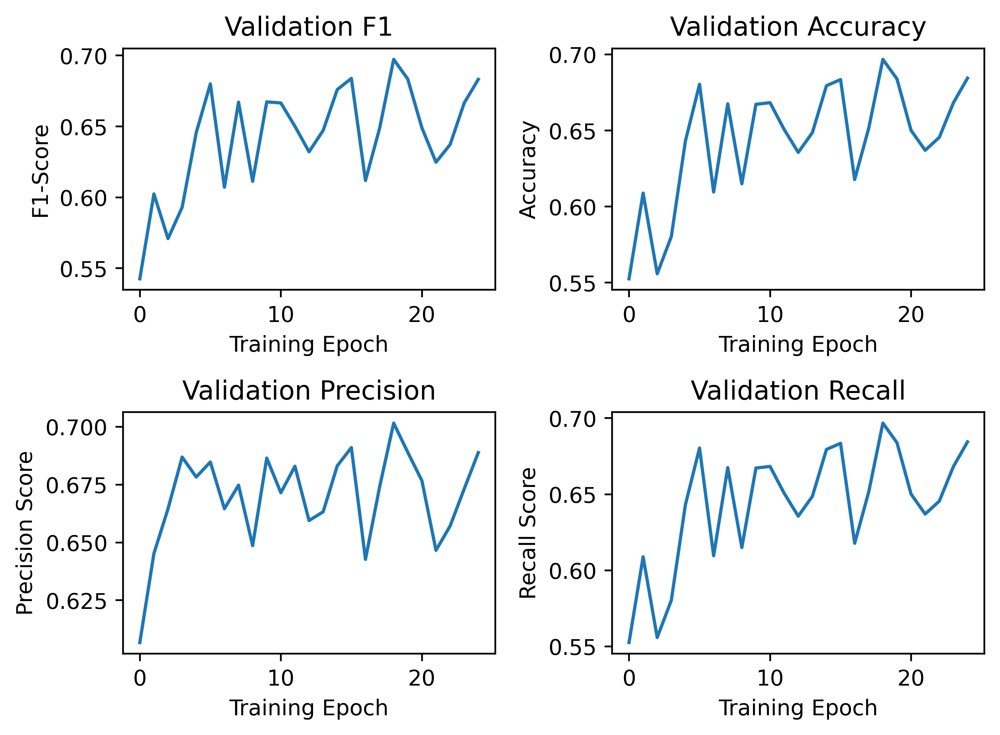

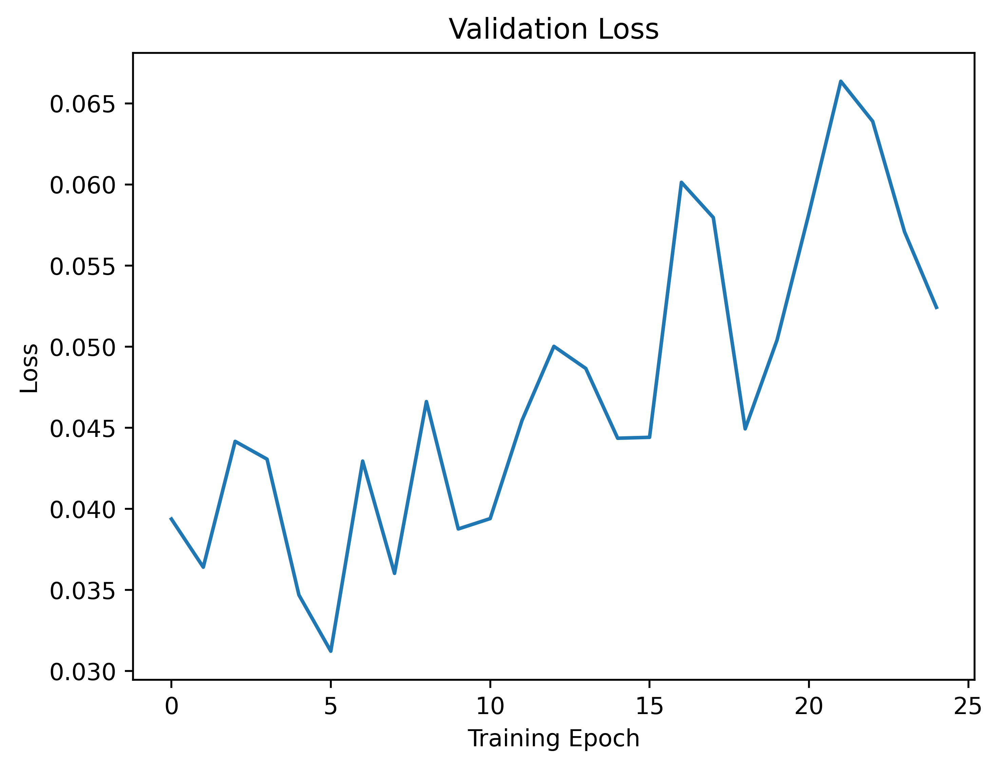

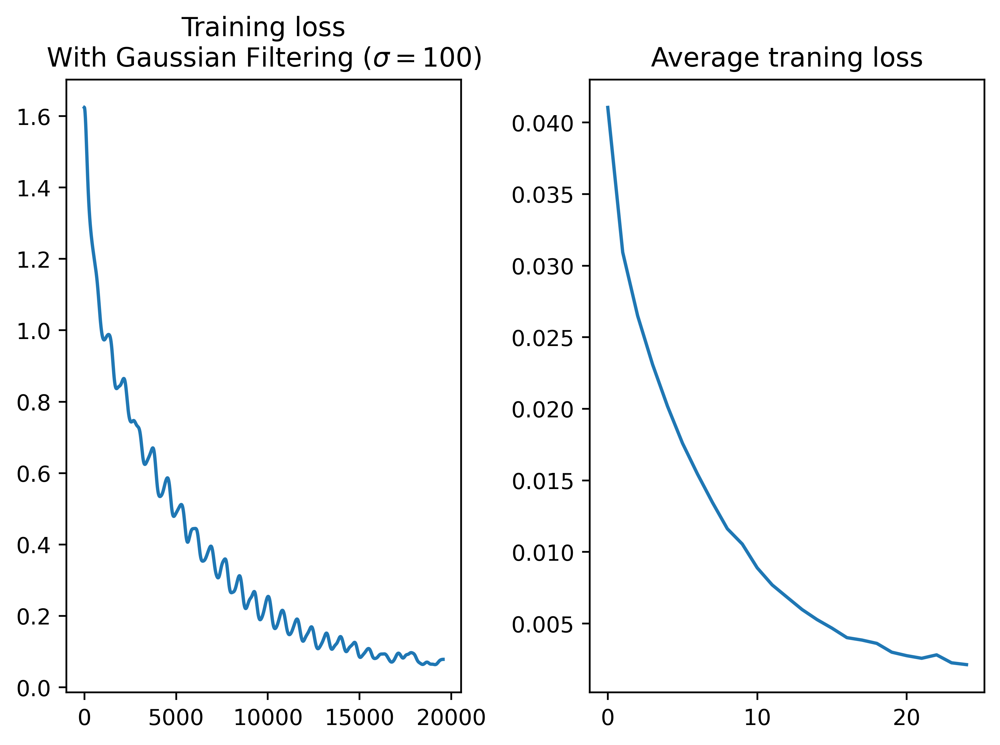

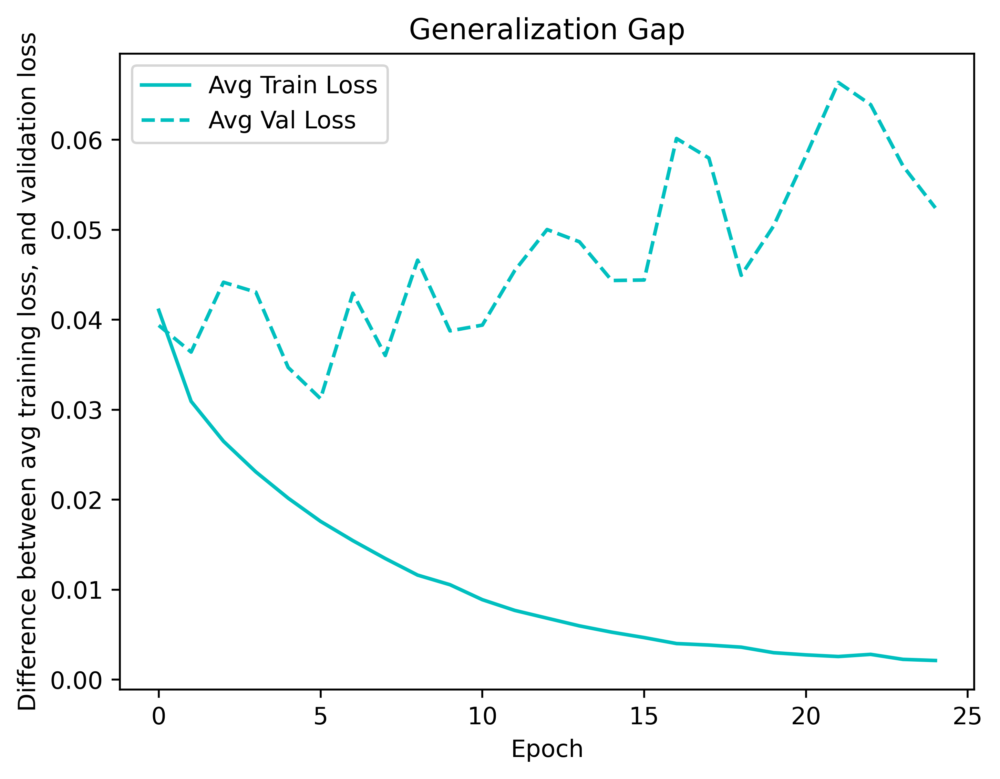

In [76]:
# Plot model metrics
plt.figure(dpi=500)
plt.subplot(2, 2, 1)
plt.title("Validation F1")
plt.plot([val_step['weighted avg']['f1-score'] for val_step in e3p3_results['val_metrics']])
plt.xlabel("Training Epoch")
plt.ylabel("F1-Score")

plt.subplot(2, 2, 2)
plt.title("Validation Accuracy")
plt.plot([val_step['accuracy'] for val_step in e3p3_results['val_metrics']])
plt.xlabel("Training Epoch")
plt.ylabel("Accuracy")

plt.subplot(2, 2, 3)
plt.title("Validation Precision")
plt.plot([val_step['weighted avg']['precision'] for val_step in e3p3_results['val_metrics']])
plt.xlabel("Training Epoch")
plt.ylabel("Precision Score")

plt.subplot(2, 2, 4)
plt.title("Validation Recall")
plt.plot([val_step['weighted avg']['recall'] for val_step in e3p3_results['val_metrics']])
plt.xlabel("Training Epoch")
plt.ylabel("Recall Score")

plt.tight_layout()
plt.show()

plt.figure(dpi=500)

plt.title("Validation Loss")
plt.plot(e3p3_results['val_loss'])
plt.ylabel("Loss")
plt.xlabel("Training Epoch")
plt.show()

plt.figure(dpi=500)
plt.subplot(1, 2, 1)
plt.title(f"Training loss\nWith Gaussian Filtering ($\sigma = {sigma}$)")
plt.plot(gaussian_filter(e3p3_results["train_loss"], sigma))
plt.subplot(1, 2, 2)
plt.title(f"Average traning loss")
plt.plot(e3p3_results["avg_loss"])
plt.tight_layout()
plt.show()

plt.figure(dpi=500)
plt.title("Generalization Gap")
plt.plot(e3p3_results["avg_loss"], c='c', label="Avg Train Loss")
plt.plot(e3p3_results["val_loss"], c='c', label='Avg Val Loss', linestyle='dashed')
plt.xlabel("Epoch")
plt.ylabel("Difference between avg training loss, and validation loss")
plt.legend()
plt.show()


# Conclusions and Discussion (instructions) - 25 MARKS <ignore>
In this section, you are expected to:
* briefly summarise and describe the conclusions from your experiments (8 MARKS).
* discuss whether or not your results are expected, providing scientific reasons (8 MARKS).
* discuss two or more alternative/additional methods that may enhance your model, with scientific reasons (4 MARKS). 
* Reference two or more relevant academic publications that support your discussion. (4 MARKS)

In this report, I investigated the impact of learning rate, dropout rate, and batch normalization on the performance of a model. I found that the models with relatively high learning rates, 0.01 achieve better performance than lower learning rates, and that linear interpolation of the learning rate throughout training is unsuitable for learning rate schedulers. These results are expected as higher learning rates mean faster conversion, but not necessarily better performance. By training the models for longer, we might've been able to find lower learning rates achieve better performance. Dropout rate has little effect on the performance of the model as it is used to prevent overfitting, which the first experiment demonstrated wasn't occuring [9]. Batch normalization had a negative effect on the models performance, as it has a higher generalization gap. To further improve the performance of the model, further work could investigate these results over more training epochs, I was unable to test this myself due to the time necessary to repeatedly train these models. The models do seem to stabalise on a fixed solution, but they for certain results do not, so they should all be trained for longer. 

Cyclical learning rate schedulers should also be tested, as they  demonstrate significant performance gains in training by escaping local minima, end encouraging exploration of the loss space [9]. 

# References (instructions) <ignore>
Use the cell below to add your references. A good format to use for references is like this:

[AB Name], [CD Name], [EF Name] ([year]), [Article title], [Journal/Conference Name] [volume], [page numbers] or [article number] or [doi]

Some examples:

JEM Bennett, A Phillipides, T Nowotny (2021), Learning with reinforcement prediction errors in a model of the Drosophila mushroom body, Nat. Comms 12:2569, doi: 10.1038/s41467-021-22592-4

SO Kaba, AK Mondal, Y Zhang, Y Bengio, S Ravanbakhsh (2023), Proc. 40th Int. Conf. Machine Learning, 15546-15566

<ignore> <!-- References don't count to the word limit so I'm ignoring this so it doesn't screw me over later -->

[1] P. Angelov, A. Gegov, C. Jayne, and Q. Shen.  *Advances in Computational Intelligence Systems: Contributions Presented at the 16th UK Workshop on Computational Intelligence, September 7\--9, 2016, Lancaster, UK*. Advances in Intelligent Systems and Computing.  Springer International Publishing, 2016.

[2] Ahmet Demirkaya, Jiasi Chen, and Samet Oymak. Exploring the role of loss functions in multiclass classification. In *2020 54th Annual Conference on Information Sciences and Systems (CISS)*, pages 1\--5, 2020.

[3] Alexey Dosovitskiy, Lucas Beyer, Alexander Kolesnikov, Dirk Weissenborn, Xiaohua Zhai, Thomas Unterthiner, Mostafa Dehghani, Matthias Minderer, Georg Heigold, Sylvain Gelly, Jakob Uszkoreit, and Neil Houlsby. An image is worth 16x16 words: Transformers for image recognition at scale. *CoRR*, abs/2010.11929, 2020.  

[4] I. Goodfellow, Y. Bengio, and A. Courville.  *Deep Learning*. Adaptive Computation and Machine Learning series. MIT Press, 2016.


[5] H M Dipu Kabir. Reduction of class activation uncertainty with background information, 2024. 

[6] Kuntal Kumar Pal and K. S. Sudeep.  Preprocessing for image classification by convolutional neural networks.  In *2016 IEEE International Conference on Recent Trends in Electronics, Information & Communication Technology (RTEICT)*, pages 1778\--1781, 2016. 

[7] Anqi Mao, Mehryar Mohri, and Yutao Zhong.  Cross-entropy loss functions: Theoretical analysis and applications. In Andreas Krause, Emma Brunskill, Kyunghyun Cho, Barbara Engelhardt, Sivan Sabato, and Jonathan Scarlett, editors, *Proceedings of the 40th International Conference on Machine Learning*, volume 202 of *Proceedings of Machine Learning Research*, pages 23803\--23828. PMLR, 23\--29 Jul 2023

[8] Seol-Hyun Noh. Performance comparison of cnn models using gradient flow analysis. *Informatics*, 8(3), 2021.

[9] Sungheon Park and Nojun Kwak. Analysis on the dropout effect in convolutional neural networks. In Shang-Hong Lai, Vincent Lepetit, Ko Nishino, and Yoichi Sato, editors, *Computer Vision \-- ACCV 2016*, pages 189\--204, Cham, 2017. Springer International Publishing. 

[9] Leslie N. Smith. A disciplined approach to neural network hyper-parameters: Part 1 - learning rate, batch size, momentum, and weight decay. *CoRR*, abs/1803.09820, 2018.

[10] S. Sra, S. Nowozin, and S.J. Wright.  *Optimization for Machine Learning*. Neural information processing series. MIT Press, 2012.  

[11] Martin Thoma. Analysis and optimization of convolutional neural network architectures. *CoRR*, abs/1707.09725, 2017. 

[12] Jing Yang and Guanci Yang. Modified convolutional neural network based on dropout and the stochastic gradient descent optimizer. *Algorithms*, 11(3):28, 2018.

[13] Y. Lecun, L. Bottou, Y. Bengio and P. Haffner, "Gradient-based learning applied to document recognition," in Proceedings of the IEEE, vol. 86, no. 11, pp. 2278-2324, Nov. 1998, doi: 10.1109/5.726791. keywords: {Neural networks;Pattern recognition;Machine learning;Optical character recognition software;Character recognition;Feature extraction;Multi-layer neural network;Optical computing;Hidden Markov models;Principal component analysis}, 